# Averaging frames and Amorphous Calculation and fititng the peaks    


In [83]:
import re
import os
import glob
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import FuncFormatter

useful functions

In [84]:
def set_plot_style(axs, fonts, xlabel, ylabel):
    axs.set_xlabel(xlabel, fontsize=fonts)
    axs.set_ylabel(ylabel, fontsize=fonts)
    axs.tick_params(axis='both', which='major', direction='out', length=4, width=1)
    axs.tick_params(which='minor', width=1, size=2)  # Adjust size as needed
    axs.minorticks_on() # Turn on minor ticks
    
    #axs.grid(False, which='both', axis='both', linestyle='--', linewidth=0.5)
    axs.set_facecolor('white')
    axs.spines['top'].set_linewidth(1)
    axs.spines['right'].set_linewidth(1)
    axs.spines['bottom'].set_linewidth(1)
    axs.spines['left'].set_linewidth(1)
    axs.tick_params(axis='x', labelsize=fonts)
    axs.tick_params(axis='y', labelsize=fonts)

    return axs




import os

def read_single_file_with_keyword(folder_path, filename_search):
    file_path = os.path.join(folder_path, f"{filename_search}")

    try:
        with open(file_path, 'r') as file:
            # Read and parse the data from the file
            # Assume the data format includes 'q_nm^-1' and 'I'
            data = {
                "q_nm^-1": [],  # List of q values
                "I": [],  # List of corresponding I values
                "sigma": [],  # List of corresponding sigma values
                "I_fit": []  # List of corresponding I_fit values
            }

            # Initialize variables
            time_hr, CTEMP, I0, bstop = None, None, None, None
            lorentian_length, lorentian_scale, peak_pos, porod_exp, porod_scale = None, None, None, None, None

            for i, line in enumerate(file):
                if i == 3 and line.startswith("#"):  # Extract values from the 4th line starting with '#'
                    values_str = line[1:].strip().split(',')
                    if len(values_str) == 4:
                        values = [float(val.strip('()')) for val in values_str]
                        time_hr, CTEMP, I0, bstop = values
                    continue

                if i == 5 and line.startswith("#"):  # Extract values from the 6th line starting with '#'
                    values_str = line[1:].strip().split(',')
                    if len(values_str) == 5:
                        values = [float(val.strip('()')) for val in values_str]
                        lorentian_length, lorentian_scale, peak_pos, porod_exp, porod_scale = values
                    continue

                if line.startswith("#"):  # Skip other comments if any
                    continue


                parts = line.strip().split()  # Assuming data is whitespace-separated
                if len(parts) >= 2:
                    q_value = float(parts[0])
                    I_value = float(parts[1])
                    I_sigma = float(parts[2])
                    I_fit = float(parts[3]) 
                   

                    # Append values to the data dictionary
                    data["q_nm^-1"].append(q_value)
                    data["I"].append(I_value)
                    data["sigma"].append(I_sigma)
                    data["I_fit"].append(I_fit)

            return data, time_hr, CTEMP, I0, bstop, lorentian_length, lorentian_scale, peak_pos, porod_exp, porod_scale

    except FileNotFoundError:
        print(f"File not found: {file_path}")
        return None, None, None, None, None


import os

def read_single_file_with_keyword_general(folder_path, filename_search):
    file_path = os.path.join(folder_path, f"{filename_search}")

    try:
        with open(file_path, 'r') as file:
            # Read and parse the data from the file
            # Assume the data format includes 'q_nm^-1' and 'I'
            data = {
                "col1": [],  # List of q values
                "col2": [],  # List of corresponding I values
                "col3": [],  # List of corresponding sigma values
                "col4": []   # List of corresponding I_fit values
            }

            # Initialize parameters
            par1, par2, par3, par4, par5, par6, par7, par8, par9, par10 = None, None, None, None, None, None, None, None, None, None

            # Read the 3rd line and extract values
            for i, line in enumerate(file):
                if i == 3 and line.startswith("#"):  # Extract values from the 4th line starting with '#'
                    values_str = line[1:].strip().split(',')
                    values = [float(val.strip('()')) for val in values_str]
                    par1, par2, par3, par4, par5, par6, par7, par8, par9, par10 = values
                    continue

                if line.startswith("#"):  # Skip other comments if any
                    continue


                parts = line.strip().split()  # Assuming data is whitespace-separated
                if len(parts) >= 2:
                    q = float(parts[0])
                    I1 = float(parts[1])
                    I2 = float(parts[2])
                    I3 = float(parts[3])

                    # Append values to the data dictionary using generic column names
                    data["col1"].append(q)
                    data["col2"].append(I1)
                    data["col3"].append(I2)
                    data["col4"].append(I3)

            # Return the data dictionary and other parameters
            return data, par1, par2, par3, par4, par5, par6, par7, par8, par9, par10

    except FileNotFoundError:
        print(f"File not found: {file_path}")
        # Return None for all parameters in case of file not found
        return None, None, None, None, None, None, None, None, None, None



import os
import re

def search_dat_files_with_keywords(folder_path, keyword):
    # Create a regular expression pattern to match the keyword and bkg_keyword in the filename
    pattern = re.compile(f"{keyword}", re.IGNORECASE)

    matching_dat_files = []

    # List files in the folder (not including subfolders)
    for file in os.listdir(folder_path):
        if pattern.match(file) and file.endswith('.dat'):
            matching_dat_files.append(file)

    #print(f"Found {len(matching_dat_files)} files matching the pattern '{pattern.pattern}'")
    return matching_dat_files





def darken_colors(num_colors, darker_factor=0.65):
    """
    Darken a set of colors by reducing the value component in the HSV color space.

    Parameters:
    - num_colors (int): Number of colors to generate.
    - darker_factor (float): Factor to control the darkness of the colors. Default is 0.7.

    Returns:
    - darker_colors (numpy.ndarray): Darkened colors in RGB format.
    """
    colors = plt.cm.jet(np.linspace(0, 1, num_colors))

    # Make the colors darker by reducing the value component
    darker_colors = colors.copy()

    for i in range(num_colors):
        rgb = darker_colors[i, :3]  # Extract the RGB values
        hsv = plt.cm.colors.rgb_to_hsv(rgb)  # Convert RGB to HSV
        hsv[2] *= darker_factor  # Reduce the value component
        darker_colors[i, :3] = plt.cm.colors.hsv_to_rgb(hsv)  # Convert back to RGB

    return darker_colors

# Step 2: Amorphous Calibration and Peak fitting


function for Amorphus fraction determination

In [85]:
# -*- coding: utf-8 -*-
"""
Created on Wed Dec 30 16:05:47 2015

@author: M Wieser

LICENCE
This program is free software: you can redistribute it and/or modify
it under the terms of the GNU Lesser General Public License as published by
the Free Software Foundation, either version 3 of the License, or
(at your option) any later version.

This program is distributed in the hope that it will be useful,
but WITHOUT ANY WARRANTY; without even the implied warranty of
MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.  See the
GNU Lesser General Public License for more details.

You should have received a copy of the GNU Lesser General Public License
along with this program.  If not, see <http://www.gnu.org/licenses/>
"""


import numpy as np
from scipy.sparse.linalg import spsolve
from scipy.linalg import cholesky
# from scikits.sparse.cholmod import cholesky
from scipy import sparse

from scipy.stats import norm
import matplotlib.pyplot as pl


def als(y, lam=1e6, p=0.1, itermax=10):
    r"""
    Implements an Asymmetric Least Squares Smoothing
    baseline correction algorithm (P. Eilers, H. Boelens 2005)

    Baseline Correction with Asymmetric Least Squares Smoothing
    based on https://github.com/vicngtor/BaySpecPlots

    Baseline Correction with Asymmetric Least Squares Smoothing
    Paul H. C. Eilers and Hans F.M. Boelens
    October 21, 2005

    Description from the original documentation:

    Most baseline problems in instrumental methods are characterized by a smooth
    baseline and a superimposed signal that carries the analytical information: a series
    of peaks that are either all positive or all negative. We combine a smoother
    with asymmetric weighting of deviations from the (smooth) trend get an effective
    baseline estimator. It is easy to use, fast and keeps the analytical peak signal intact.
    No prior information about peak shapes or baseline (polynomial) is needed
    by the method. The performance is illustrated by simulation and applications to
    real data.


    Inputs:
        y:
            input data (i.e. chromatogram of spectrum)
        lam:
            parameter that can be adjusted by user. The larger lambda is,
            the smoother the resulting background, z
        p:
            wheighting deviations. 0.5 = symmetric, <0.5: negative
            deviations are stronger suppressed
        itermax:
            number of iterations to perform
    Output:
        the fitted background vector

    """
    L = len(y)
#  D = sparse.csc_matrix(np.diff(np.eye(L), 2))
    D = sparse.eye(L, format='csc')
    D = D[1:] - D[:-1]  # numpy.diff( ,2) does not work with sparse matrix. This is a workaround.
    D = D[1:] - D[:-1]
    D = D.T
    w = np.ones(L)
    for i in range(itermax):
        W = sparse.diags(w, 0, shape=(L, L))
        Z = W + lam * D.dot(D.T)
        z = spsolve(Z, w * y)
        w = p * (y > z) + (1 - p) * (y < z)
    return z


def arpls(y, lam=1e4, ratio=0.05, itermax=100):
    r"""
    Baseline correction using asymmetrically
    reweighted penalized least squares smoothing
    Sung-June Baek, Aaron Park, Young-Jin Ahna and Jaebum Choo,
    Analyst, 2015, 140, 250 (2015)

    Abstract

    Baseline correction methods based on penalized least squares are successfully
    applied to various spectral analyses. The methods change the weights iteratively
    by estimating a baseline. If a signal is below a previously fitted baseline,
    large weight is given. On the other hand, no weight or small weight is given
    when a signal is above a fitted baseline as it could be assumed to be a part
    of the peak. As noise is distributed above the baseline as well as below the
    baseline, however, it is desirable to give the same or similar weights in
    either case. For the purpose, we propose a new weighting scheme based on the
    generalized logistic function. The proposed method estimates the noise level
    iteratively and adjusts the weights correspondingly. According to the
    experimental results with simulated spectra and measured Raman spectra, the
    proposed method outperforms the existing methods for baseline correction and
    peak height estimation.

    Inputs:
        y:
            input data (i.e. chromatogram of spectrum)
        lam:
            parameter that can be adjusted by user. The larger lambda is,
            the smoother the resulting background, z
        ratio:
            wheighting deviations: 0 < ratio < 1, smaller values allow less negative values
        itermax:
            number of iterations to perform
    Output:
        the fitted background vector

    """
    N = len(y)
#  D = sparse.csc_matrix(np.diff(np.eye(N), 2))
    D = sparse.eye(N, format='csc')
    D = D[1:] - D[:-1]  # numpy.diff( ,2) does not work with sparse matrix. This is a workaround.
    D = D[1:] - D[:-1]

    H = lam * D.T * D
    w = np.ones(N)
    for i in range(itermax):
        W = sparse.diags(w, 0, shape=(N, N))
        WH = sparse.csc_matrix(W + H)
        C = sparse.csc_matrix(cholesky(WH.todense()))
        z = spsolve(C, spsolve(C.T, w * y))
        d = y - z
        dn = d[d < 0]
        m = np.mean(dn)
        s = np.std(dn)
        wt = 1. / (1 + np.exp(2 * (d - (2 * s - m)) / s))
        if np.linalg.norm(w - wt) / np.linalg.norm(w) < ratio:
            break
        w = wt
    return z



def WhittakerSmooth(x, w, lam, differences=1):
    '''
    Penalized least squares algorithm for background fitting

    input
        x:
            input data (i.e. chromatogram of spectrum)
        w:
            binary masks (value of the mask is zero if a point belongs to peaks
            and one otherwise)
        lam:
            parameter that can be adjusted by user. The larger lambda is,  the
            smoother the resulting background
        differences:
            integer indicating the order of the difference of penalties

    output:
        the fitted background vector
    '''
    X = np.matrix(x)
    m = X.size
#    D = csc_matrix(np.diff(np.eye(m), differences))
    D = sparse.eye(m, format='csc')
    for i in range(differences):
        D = D[1:] - D[:-1]  # numpy.diff() does not work with sparse matrix. This is a workaround.
    W = sparse.diags(w, 0, shape=(m, m))
    A = sparse.csc_matrix(W + (lam * D.T * D))
    B = sparse.csc_matrix(W * X.T)
    background = spsolve(A, B)
    return np.array(background)



def airpls(x, lam=100, porder=1, itermax=100):
    '''
    airpls.py Copyright 2014 Renato Lombardo - renato.lombardo@unipa.it
    Baseline correction using adaptive iteratively reweighted penalized least squares

    This program is a translation in python of the R source code of airPLS version 2.0
    by Yizeng Liang and Zhang Zhimin - https://code.google.com/p/airpls
    Reference:
    Z.-M. Zhang, S. Chen, and Y.-Z. Liang, Baseline correction using adaptive
    iteratively reweighted penalized least squares. Analyst 135 (5), 1138-1146 (2010).

    Description from the original documentation:

    Baseline drift always blurs or even swamps signals and deteriorates analytical
    results, particularly in multivariate analysis.  It is necessary to correct
    baseline drift to perform further data analysis. Simple or modified polynomial
    fitting has been found to be effective in some extent. However, this method
    requires user intervention and prone to variability especially in low
    signal-to-noise ratio environments. The proposed adaptive iteratively
    reweighted Penalized Least Squares (airPLS) algorithm doesn't require any
    user intervention and prior information, such as detected peaks. It
    iteratively changes weights of sum squares errors (SSE) between the fitted
    baseline and original signals, and the weights of SSE are obtained adaptively
    using between previously fitted baseline and original signals. This baseline
    estimator is general, fast and flexible in fitting baseline.

    Adaptive iteratively reweighted penalized least squares for baseline fitting

    input
        x:
            input data (i.e. chromatogram of spectrum)
        lam:
            parameter that can be adjusted by user. The larger lambda is,
            the smoother the resulting background, z
        porder:
            integer indicating the order of the difference of penalties

    output:
        the fitted background vector
    '''
    m = x.shape[0]
    w = np.ones(m)
    for i in range(1, itermax + 1):
        z = WhittakerSmooth(x, w, lam, porder)
        d = x - z
        dssn = np.abs(d[d < 0].sum())
        if(dssn < 0.001 * (abs(x)).sum() or i == itermax):
            if(i == itermax):
                print('airpls: max iteration reached!')
            break
        w[d >= 0] = 0  # d>0 means that this point is part of a peak,
        # so its weight is set to 0 in order to ignore it
        w[d < 0] = np.exp(i * np.abs(d[d < 0]) / dssn)
        w[0] = np.exp(i * (d[d < 0]).max() / dssn)
        w[-1] = w[0]
    return z




In [86]:

import math

def calculate_percentage_crystal(area_I_sub, area_I_smoothed, delta_area_I_sub, delta_area_I_smoothed):
    # Calculate the percentage_crystal
    percentage_crystal = (area_I_sub / (area_I_sub + area_I_smoothed)) * 100
    
    # Calculate the relative uncertainty using the formula
    relative_uncertainty = math.sqrt((delta_area_I_sub / area_I_sub)**2 + ((delta_area_I_sub / (area_I_sub + area_I_smoothed)) + (delta_area_I_smoothed / (area_I_sub + area_I_smoothed)))**2)
    
    # Calculate the error in percentage_crystal
    delta_percentage_crystal = relative_uncertainty * percentage_crystal
    
    return percentage_crystal, delta_percentage_crystal


import numpy as np
from scipy.optimize import curve_fit
import matplotlib.pyplot as plt

def gaussian(x, amplitude, mean, stddev):
    return amplitude * np.exp(-((x - mean) / (2 * stddev))**2)

def multi_gaussian(x, *params):
    num_peaks = len(params) // 3
    result = np.zeros_like(x)
    
    for i in range(num_peaks):
        amplitude = params[i * 3]
        mean = params[i * 3 + 1]
        stddev = params[i * 3 + 2]
        result += gaussian(x, amplitude, mean, stddev)
    
    return result

def fit_five_peaks(x, y, initial_guess, maxfev=3200):
    params, covariance = curve_fit(multi_gaussian, x, y, p0=initial_guess, maxfev=maxfev)
    
    # Calculate the standard deviations (errors) of the fitted parameters
    errors = np.sqrt(np.diag(covariance))

    I_fit = multi_gaussian(x, *params)
    
    # Plot the original data and the fitted curve with error bars
    plt.plot(x, y, 'bo', label='Data-Amorphous')
    plt.plot(x, multi_gaussian(x, *params), 'r-', label='Fitted Curve')
    
    # Plot individual Gaussian peaks
    for i in range(len(initial_guess) // 3):
        plt.plot(x, gaussian(x, params[i * 3], params[i * 3 + 1], params[i * 3 + 2]), '--', label=f'Peak {i+1}')
        
    I_peak1 = gaussian(x, params[0], params[1], params[2])
    I_peak2 = gaussian(x, params[3], params[4], params[5])
    I_peak3 = gaussian(x, params[6], params[7], params[8])
    I_peak4 = gaussian(x, params[9], params[10], params[11])
    I_peak5 = gaussian(x, params[12], params[13], params[14])

    plt.legend()
    plt.show()

    return I_fit, I_peak1,I_peak2, I_peak3,I_peak4,I_peak5, params, errors
# smoothing of data

import numpy as np

def smooth_data(input_array, window_size=3):
    """
    Smooth the input array using a simple moving average.

    Parameters:
    - input_array: numpy array
        The input array to be smoothed.
    - window_size: int, optional (default: 3)
        The size of the moving average window.

    Returns:
    - smoothed_array: numpy array
        The smoothed array with the same length as the input array.
    """
    cumsum = np.cumsum(input_array, dtype=float)
    cumsum[window_size:] = cumsum[window_size:] - cumsum[:-window_size]
    smoothed_array = cumsum[window_size - 1:] / window_size

    # Pad the beginning of the array to maintain the same length
    pad_size = window_size - 1
    pad_values = np.cumsum(input_array[:pad_size], dtype=float)
    pad_values /= np.arange(1, pad_size + 1)
    smoothed_array = np.concatenate((pad_values, smoothed_array))

    return smoothed_array



# This function calculates the percentage of crystallinity and its error
import math

def calculate_percentage_crystal(area_I_sub, area_I_smoothed, delta_area_I_sub, delta_area_I_smoothed):
    # Calculate the percentage_crystal
    percentage_crystal = (area_I_sub / (area_I_sub + area_I_smoothed)) * 100
    
    # Calculate the relative uncertainty using the formula
    relative_uncertainty = math.sqrt((delta_area_I_sub / area_I_sub)**2 + ((delta_area_I_sub / (area_I_sub + area_I_smoothed)) + (delta_area_I_smoothed / (area_I_sub + area_I_smoothed)))**2)
    
    # Calculate the error in percentage_crystal
    delta_percentage_crystal = relative_uncertainty * percentage_crystal
    
    return percentage_crystal, delta_percentage_crystal




# 1 Average frames and Amorphous Calculation by ARLSS and save the results



Input Parameters 

['Run8_Mix_MeOHDMEA_Hold190_ctr0__ratio_all_avg_sub.dat']
Percentage crystallinity: 10.61 ± 0.11 %
0
['Run8_Mix_MeOHDMEA_Hold190_ctr1__ratio_all_avg_sub.dat']
Percentage crystallinity: 12.11 ± 0.11 %
1
['Run8_Mix_MeOHDMEA_Hold190_ctr2__ratio_all_avg_sub.dat']
Percentage crystallinity: 11.32 ± 0.11 %
2
['Run8_Mix_MeOHDMEA_Hold190_ctr3__ratio_all_avg_sub.dat']
Percentage crystallinity: 10.45 ± 0.11 %
3
['Run8_Mix_MeOHDMEA_Hold190_ctr4__ratio_all_avg_sub.dat']
Percentage crystallinity: 10.31 ± 0.11 %
4
['Run8_Mix_MeOHDMEA_Hold190_ctr5__ratio_all_avg_sub.dat']
Percentage crystallinity: 10.39 ± 0.11 %
5
['Run8_Mix_MeOHDMEA_Hold190_ctr6__ratio_all_avg_sub.dat']
Percentage crystallinity: 9.63 ± 0.11 %
6
['Run8_Mix_MeOHDMEA_Hold190_ctr7__ratio_all_avg_sub.dat']
Percentage crystallinity: 10.93 ± 0.11 %
7
['Run8_Mix_MeOHDMEA_Hold190_ctr8__ratio_all_avg_sub.dat']
Percentage crystallinity: 10.59 ± 0.11 %
8
['Run8_Mix_MeOHDMEA_Hold190_ctr9__ratio_all_avg_sub.dat']
Percentage crystallinity: 9.32 ± 0

/var/folders/0q/m0d3p44n2cb5dg956r2m2f782yh1mf/T/ipykernel_1879/4116674163.py:73: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs2 = plt.subplots(figsize=(4.3, 3.6))


18
['Run8_Mix_MeOHDMEA_Hold190_ctr19__ratio_all_avg_sub.dat']
Percentage crystallinity: 7.30 ± 0.11 %
19
['Run8_Mix_MeOHDMEA_Hold190_ctr20__ratio_all_avg_sub.dat']
Percentage crystallinity: 10.02 ± 0.11 %
20
['Run8_Mix_MeOHDMEA_Hold190_ctr21__ratio_all_avg_sub.dat']
Percentage crystallinity: 7.72 ± 0.11 %
21
['Run8_Mix_MeOHDMEA_Hold190_ctr22__ratio_all_avg_sub.dat']
Percentage crystallinity: 8.66 ± 0.12 %
22
['Run8_Mix_MeOHDMEA_Hold190_ctr23__ratio_all_avg_sub.dat']
Percentage crystallinity: 10.38 ± 0.12 %
23
['Run8_Mix_MeOHDMEA_Hold190_ctr24__ratio_all_avg_sub.dat']
Percentage crystallinity: 7.32 ± 0.12 %
24
['Run8_Mix_MeOHDMEA_Hold190_ctr25__ratio_all_avg_sub.dat']
Percentage crystallinity: 7.87 ± 0.12 %
25
['Run8_Mix_MeOHDMEA_Hold190_ctr26__ratio_all_avg_sub.dat']
Percentage crystallinity: 9.69 ± 0.12 %
26
['Run8_Mix_MeOHDMEA_Hold190_ctr27__ratio_all_avg_sub.dat']
Percentage crystallinity: 9.45 ± 0.12 %
27
['Run8_Mix_MeOHDMEA_Hold190_ctr28__ratio_all_avg_sub.dat']
Percentage crystal

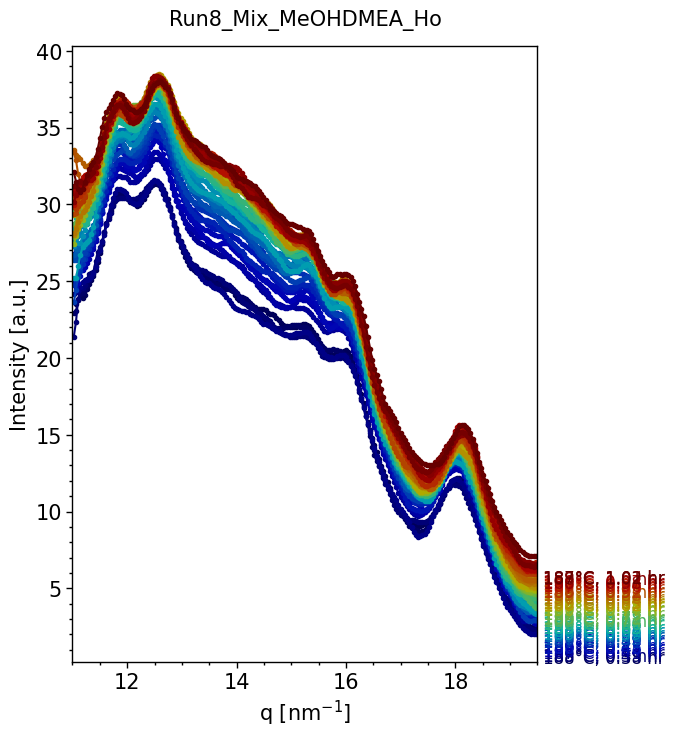

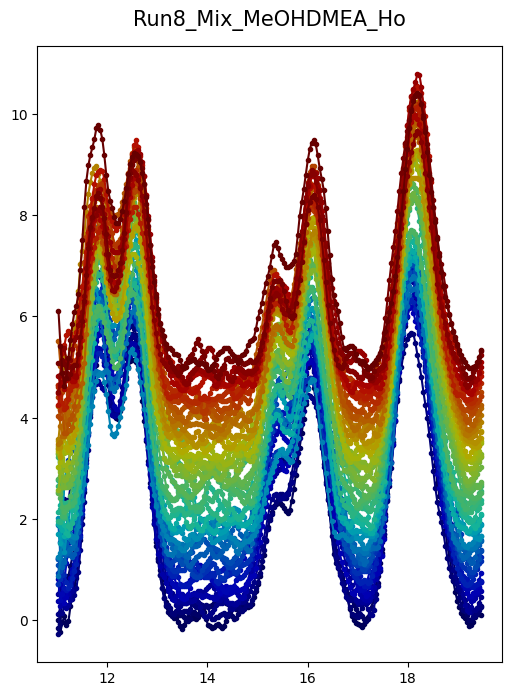

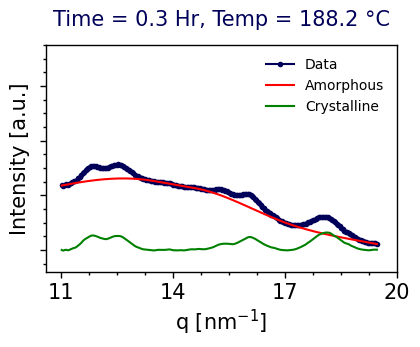

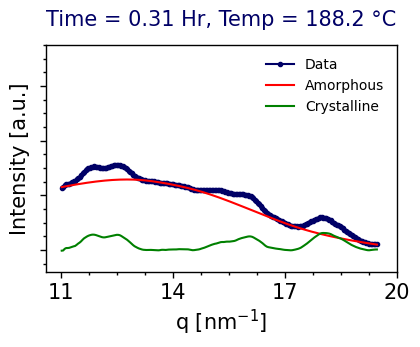

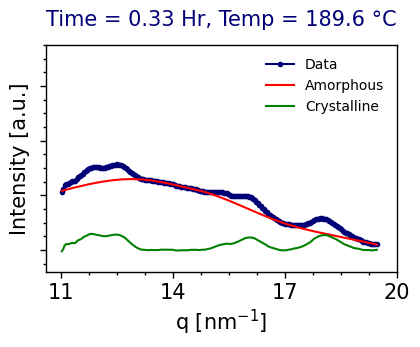

...

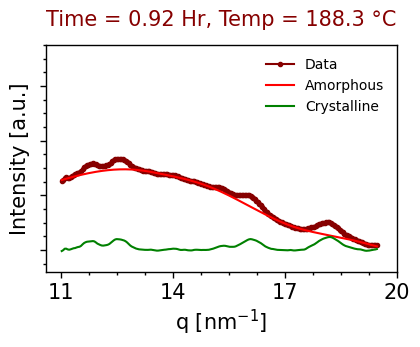

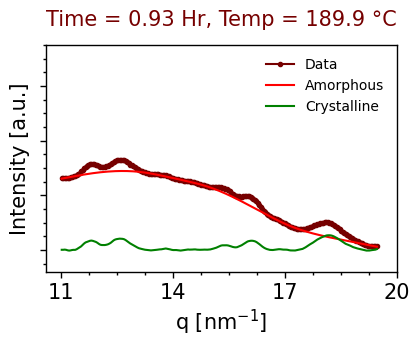

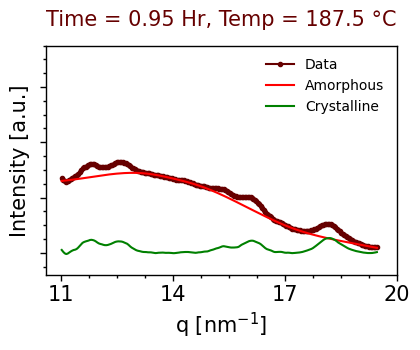

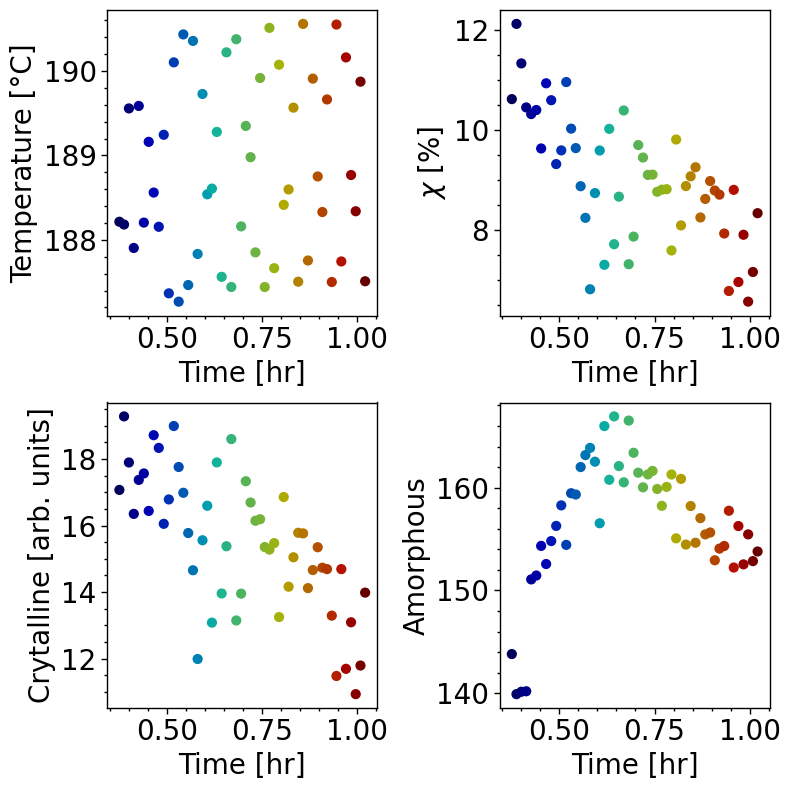

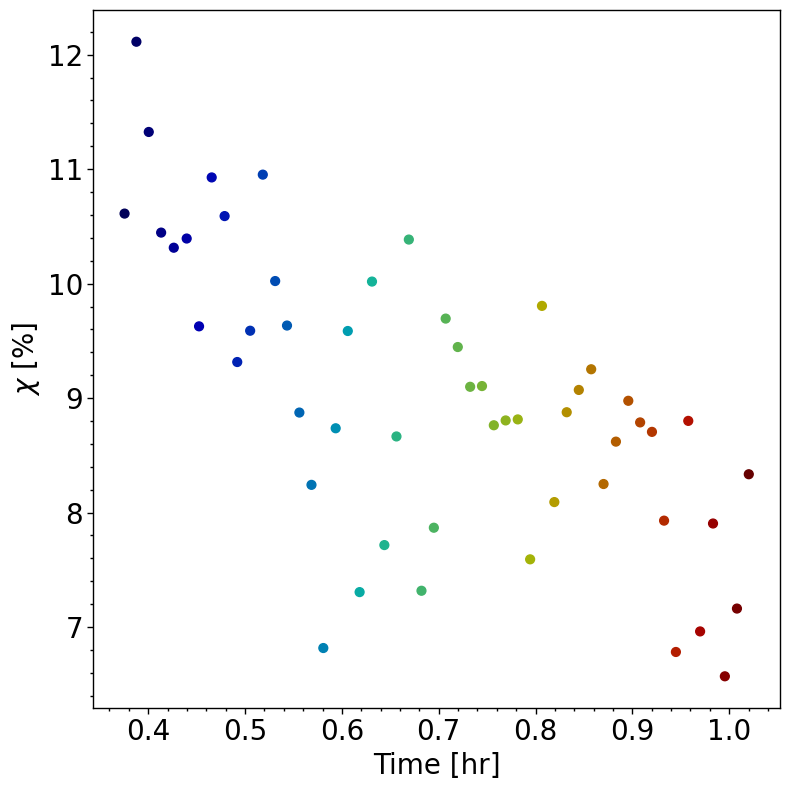

In [87]:
#keyword="Run8_Mix_MeOHDMEA"



keyword="Run8_Mix_MeOHDMEA_Cool"
keyword="Run8_Mix_MeOHDMEA_Ramp190"
keyword="Run8_Mix_MeOHDMEA_Hold"



offset_factor = 0.1
num_files_to_plot =52
i = 0
fonts = 15

max_q_value = 19.5

#set the smoothing window size for indivdual frame
smmoth_window_size = 10

# Choose the starting index for the continuous sequence to average frames
start_index = 0
num_ave_files =1

#num_ave_files =1 # ramping

#Baseline_inputs for Amorhpus fraction detemination
lam=1000 
#lam=1000 # for ramping
porder=2
itermax=100

time_hr_values = []
CTEMP_values = []
crystal_values = []
Amorph_values = []
percentage_crytallinity = []
Per_cryst_error = []


folder_path_base = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/Dec2023/OneD_integrated_WAXS_01/Correction/Normlised'
WAXS_sub_files = os.path.join(folder_path_base.replace("Normlised", ""), "Subtracted")
save_fig = os.path.join(WAXS_sub_files.replace("Subtracted", ""))
save_extracted_data = os.path.join(save_fig, "Average_Amorph_Crystalline") # read the data from this folder

save_fitted_results= os.path.join((WAXS_sub_files.replace("Correction/Subtracted", "")), "Analysis")

# Get a list of files containing the specified keyword
matching_sample_files = [file for file in os.listdir(WAXS_sub_files) if keyword in file]
# Define a custom sorting function
def custom_sort(file_name):
    keywords = ['RT', 'Ramp', 'Hold', 'Cool','_T']
    # Find the first keyword in the file name
    keyword_found = next((kw for kw in keywords if kw in file_name), '')
    # Extract the value after 'ctr' in the file name
    ctr_value = int(file_name.split('ctr')[-1].split('_')[0]) if 'ctr' in file_name else 0
    return (keywords.index(keyword_found), ctr_value)

# Sort the files using the custom sorting function
matching_sample_files.sort(key=lambda x: custom_sort(x))

# Create a single figure outside the loop
fig, axs = plt.subplots(figsize=(6, 8))
fig, axs1 = plt.subplots(figsize=(6, 8))

num_colors = num_files_to_plot + 1
darker_colors = darken_colors(num_colors, darker_factor=0.7)



for i in range(start_index, start_index + num_files_to_plot, num_ave_files):
    print(matching_sample_files[i:i+num_ave_files])
    fig, axs2 = plt.subplots(figsize=(4.3, 3.6))
    
    # Initialize arrays to store intensity, time_hr, and CTEMP values for each file in the sequence
    intensity_arrays = []
    I_sigma_arrays = [] 
    time_hr_arrays = []
    CTEMP_arrays = []
    
    for filename_search_sample in matching_sample_files[i:i+num_ave_files]:
        #print(filename_search_sample)
        sample_data, time_hr, CTEMP, I0, bstop, lorentian_length, lorentian_scale, peak_pos, porod_exp, porod_scale = read_single_file_with_keyword(WAXS_sub_files, filename_search_sample)
        q = sample_data["q_nm^-1"]
        intensity_arrays.append(sample_data["I"])
        I_sigma_arrays = sample_data["sigma"]
        time_hr_arrays.append(time_hr)
        CTEMP_arrays.append(CTEMP)

    # Average the intensity, time_hr, and CTEMP values for each q-value across the files in the sequence
    avg_intensity = np.mean(np.vstack(intensity_arrays), axis=0)
    avg_I_sigma = np.mean(np.vstack(I_sigma_arrays), axis=0)
    avg_time_hr = np.mean(time_hr_arrays)
    avg_CTEMP = np.mean(CTEMP_arrays)
    

    # Average the intensity, time_hr, and CTEMP values for each q-value across the files in the sequence
    avg_intensity = np.mean(np.vstack(intensity_arrays), axis=0)
    #avg_intensity_smoothed = np.convolve(avg_intensity, np.ones((10,))/10, mode='valid')  # Use a simple moving average with window size 3
    I_window_smoothed_frame_avg = smooth_data(avg_intensity, smmoth_window_size)
    q=np.array(q)
    mask= (q<=max_q_value)
    q = q[mask]
    #print(q)
    I = I_window_smoothed_frame_avg[mask]
    
    # Plot the smoothed averaged intensity values
    axs.plot(q, I + np.array(offset_factor * i), marker='o', markersize=3, color=darker_colors[i], label=f"Avg {matching_sample_files[i]}-{matching_sample_files[i+2]}")


    x = q
    y1 = I
    # adaptive iteratively asymmetric least squares smoothing
    baseline_airpls = airpls(y1,lam, porder, itermax)
    I_Amorph = baseline_airpls
    # Subtract smoothed intensity from original intensity
    I_subtracted = I - I_Amorph

    # crytallinity calculation
    # Assume a fraction (e.g., 0.1) of the standard deviation as the uncertainty in the baseline
    fraction_of_std_dev = 0.5
    sigma_baseline = fraction_of_std_dev * np.std(I)

    # Calculate the error bar for the subtracted intensity
    I_subtracted_error = np.sqrt(avg_I_sigma**2 + sigma_baseline**2)
    # Use trapezoidal rule for numerical integration
    area_I_sub = np.trapz(I_subtracted, q)
    # Propagate the error to the area calculation
    area_I_sub_error = np.sqrt(np.sum(I_subtracted_error**2)) * (q[1] - q[0])  # Uncertainty propagation

    area_I_smoothed = np.trapz(I_Amorph, q)
    area_I_smoothed_error = np.sqrt(np.sum(sigma_baseline**2)) * (q[1] - q[0])  # Uncertainty propagation  

    # Append the result to the list
    crystal_values.append(area_I_sub)
    #crytal_values_erroe
    Amorph_values.append(area_I_smoothed)

     ###percentage_crystal = (area_I_sub / (area_I_sub + area_I_smoothed)) * 100
    # Calculate the final error in percentage crystallinity using error propagation
    #using the varibels from above calculate the error in the percentage_crystal below
    #percentage_crytallinity_error = percentage_crystal * np.sqrt((area_I_sub_error / area_I_sub)**2 + (area_I_smoothed_error / area_I_smoothed)**2)  
    percentage_crystal, percentage_crytallinity_error = calculate_percentage_crystal(area_I_sub, area_I_smoothed, area_I_sub_error, area_I_smoothed_error)
    Per_cryst_error.append(percentage_crytallinity_error)
    
    percentage_crytallinity.append(percentage_crystal)
    print(f"Percentage crystallinity: {percentage_crystal:.2f} ± {percentage_crytallinity_error:.2f} %")    

    #plotting the subtracted and smoothed data
    axs1.plot(q, I_subtracted + np.array(offset_factor*i),marker='o', markersize=3, color=darker_colors[i],label=f"{filename_search_sample}")
    #axs.plot(q, I_fit + np.array(offset_factor**i), '--', markersize=3, color='black', label=f"Fit")
    axs1.set_title(f"{keyword[:-2]}", fontsize=fonts, y=1.02)
    
    #axs2.set_title(f"{filename_search_sample[:-4]}", fontsize=fonts-5, y=1.02)
    axs2.plot(q, I, marker='o', markersize=3,  label = "Data", color=darker_colors[i]) #: {round(time_hr-0.075, 2)} hr, {round(CTEMP, 0)} \u00b0C"
    axs2.plot(q, I_Amorph, marker='', linestyle='-', color='red', label="Amorphous")
    axs2.plot(q, I_subtracted, marker='', linestyle='-', color='green',label="Crystalline")
    set_plot_style(axs2, fonts, 'q [$\\mathrm{nm^{-1}}$]', "Intensity [a.u.]")
    #axs2.legend(loc='upper right', shadow=False, fontsize=fonts-5, frameon=False)
    axs2.legend(loc='upper right', shadow=False, fontsize=fonts-5, frameon=False)
    axs2.set_title(f"Time = {round(time_hr-0.075, 2)} Hr, Temp = {round(CTEMP, 1)} °C", fontsize=fonts, y=1.05, color=darker_colors[i])

    # yaxis labe off

    # Removing y-axis labels and ticks
    #axs2.set_yticks([])
    axs2.set_ylim(-8, 75)
    axs2.set_yticklabels([])

    axs2.set_xticks([11, 14, 17, 20])
    
    axs2.set_xticklabels(['11', '14', '17', '20'])


    plt.tight_layout()

    # Save the figure
    fig_22 = os.path.join(save_extracted_data, f"figure/{filename_search_sample}_Time_{round(time_hr-0.075, 2)}_Temp_{round(CTEMP, 0)}_chi_{round(percentage_crystal,1)}_{i}.png")
    fig.savefig(fig_22, dpi=300) 


    # Store the averaged time_hr and CTEMP values
    time_hr_values.append(avg_time_hr)
    CTEMP_values.append(avg_CTEMP)
    

    avg_CTEMP = int(avg_CTEMP)
    avg_time_hr = round(avg_time_hr, 2)
    axs.text(max_q_value+0.1, (I_subtracted[-1]+ np.array(offset_factor*i)) - 0, str(f"{avg_CTEMP}\u00b0C, {avg_time_hr} hr"), fontsize=12, color=darker_colors[i])

    #save variable
    # Create a DataFrame for subtracted data
    data = {"q_nm^-1": q, "I_window_smoothed_frame_avg": I, "I_subtracted":I_subtracted,"I_Amorphous": I_Amorph}
    df = pd.DataFrame(data)

    # Define the data file path
    # Extract the part of filename_search_sample before "scan1"
    filename_search_sample1 = filename_search_sample.split("_sub")[0]
    dat_filename = os.path.join(save_extracted_data, f"{filename_search_sample1}frame_avg_am_cry.dat")
    #print(dat_filename)
    # Define the headers
    headers = [
        f"Sample: {filename_search_sample}",
        f"Sample: {filename_search_sample}",
        "Time_duration_hr  ----- CTEMP-----crystalline_value  ----- Amorph_value -----  percentage_crytallinity",
        f"{avg_time_hr}, {avg_CTEMP},{area_I_sub}, {area_I_smoothed}, {percentage_crystal},{0},{0},{0},{0},{0}", 
        
        "q_nm^-1 ------ I_window_smoothed_frame_avg ------ I_subtracted ------ I_Amorphous",
    ]
    commented_headers = ['# ' + header for header in headers]

    # Write the data to the file
    with open(dat_filename, 'w') as dat_file:
        dat_file.write('\n'.join(commented_headers) + '\n')
        df.to_csv(dat_file, sep='\t', index=False, header=False)

    # Save the figure
    #fig_filename = os.path.join(save_extracted_data, f"figure/{filename_search_sample1}frame_avg_am_cry.png")
    #fig.savefig(fig_filename, dpi=300)  

 
    #plt.close(fig)
    print (i)
    



# Calculate the average and standard deviation of the time_hr and CTEMP values
print(len(CTEMP_values))

# first figure
axs.set_title(f"{keyword[:-2]}", fontsize=fonts, y=1.02)
axs.set_xlim(11, max_q_value)
set_plot_style(axs, fonts, 'q [$\\mathrm{nm^{-1}}$]', "Intensity [a.u.]")
fig.tight_layout()
final_fig_dir = os.path.join(save_fig, "final_fig")
if not os.path.exists(final_fig_dir):
    os.makedirs(final_fig_dir)
#fig.savefig(os.path.join(final_fig_dir, f"{keyword[:-2]}_WAXS_frame_average.png"), dpi=300) 
plt.show()

# second figure
axs1.set_title(f"{keyword[:-2]}", fontsize=fonts, y=1.02)
axs1.set_xlim(11, max_q_value)
set_plot_style(axs1, fonts, 'q [$\\mathrm{nm^{-1}}$]', "Intensity [a.u.]")
fig.tight_layout()
plt.show()


# Assuming 'fonts' is defined somewhere in your code
fonts = 20
# 3rd figure
fig, axs3 = plt.subplots(2, 2, figsize=(8, 8))
#axs[0].set_title(f"{keyword[:-2]}", fontsize=fonts, y=1.02)
axs3[0,0].scatter(time_hr_values, CTEMP_values, marker='o',s=40, c=darker_colors[:len(CTEMP_values)])
set_plot_style(axs3[0,0], fonts, 'Time [hr]', 'Temperature [°C]')
#axs3[1].scatter(CTEMP_values,time_hr_values, marker='o',s=40, c=darker_colors[:len(CTEMP_values)])
axs3[0,1].scatter(time_hr_values, percentage_crytallinity, marker='o', s=40, c=darker_colors[:len(CTEMP_values)])
set_plot_style(axs3[0,1], fonts, 'Time [hr]','$\chi$ [$\%$]')

axs3[1,0].scatter(time_hr_values, crystal_values, marker='o', s=40, c=darker_colors[:len(CTEMP_values)])
set_plot_style(axs3[1,0], fonts, 'Time [hr]','Crytalline [arb. units]')
axs3[1,1].scatter(time_hr_values, Amorph_values, marker='o', s=40, c=darker_colors[:len(CTEMP_values)])
set_plot_style(axs3[1,1], fonts, 'Time [hr]','Amorphous')


plt.tight_layout()

#fig.savefig(os.path.join(final_fig_dir, f"{keyword[:-2]}_WAXS_parameters.png"), dpi=300) 
plt.show()

#4th figure 
fig, axs4 = plt.subplots( figsize=(8, 8))
#axs3[1].scatter(CTEMP_values,time_hr_values, marker='o',s=40, c=darker_colors[:len(CTEMP_values)])
axs4.scatter(time_hr_values, percentage_crytallinity, marker='o', s=40, c=darker_colors[:len(CTEMP_values)])
set_plot_style(axs4, fonts, 'Time [hr]','$\chi$ [$\%$]')
plt.tight_layout()
plt.show()
#fig.savefig(os.path.join(final_fig_dir, f"{keyword[:-2]}_WAXS_parameters_01.png"), dpi=300) 



# Function for plotting cytallin eand Amorphous phase for Video

In [88]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


def process_and_plot_data(folder_path_base, keyword="Run8_Mix_MeOHDMEA",status="Ramping", fonts=15, offset_factor=0.1, num_files_to_plot=52,
                          smmoth_window_size=10, start_index=0, num_ave_files=1, min_q_value=10.8, max_q_value=19.5):
    
    # Define necessary variables and lists
    time_hr_values = []
    CTEMP_values = []
    crystal_values = []
    Amorph_values = []
    percentage_crytallinity = []
    Per_cryst_error = []




    # Define folder paths
    WAXS_sub_files = os.path.join(folder_path_base.replace("Normlised", ""), "Subtracted")
    save_fig = os.path.join(WAXS_sub_files.replace("Subtracted", ""))
    save_extracted_data = os.path.join(save_fig, "Average_Amorph_Crystalline")

    # Get a list of files containing the specified keyword
    matching_sample_files = [file for file in os.listdir(WAXS_sub_files) if keyword in file]
    #print
    
    # Sort the files
    def custom_sort(file_name):
        keywords = ['RT', 'Ramp', 'Hold', 'Cool','_T']
        keyword_found = next((kw for kw in keywords if kw in file_name), '')
        ctr_value = int(file_name.split('ctr')[-1].split('_')[0]) if 'ctr' in file_name else 0
        return (keywords.index(keyword_found), ctr_value)
    
    matching_sample_files.sort(key=lambda x: custom_sort(x))
    for j in matching_sample_files:
        #print(i)
        print(j)
    

    # Create subplots
    fig, axs = plt.subplots(figsize=(6, 8))
    fig, axs1 = plt.subplots(figsize=(6, 8))

    num_colors = num_files_to_plot + 1
    darker_colors = darken_colors(num_colors, darker_factor=0.7)

    if status == "Ramping":
        colors = darker_colors[:len(matching_sample_files)]
    elif status == "Cooling":
        # Make inverse of the darker colors
        colors = darker_colors[:len(matching_sample_files)][::-1]
    else:
        # Use the last color of darker colors for all points
        colors = [darker_colors[-1]] * len(matching_sample_files)
    
    for i in range(start_index, start_index + num_files_to_plot, num_ave_files):
        fig, axs2 = plt.subplots(figsize=(4.3, 3.6))
        intensity_arrays = []
        I_sigma_arrays = [] 
        time_hr_arrays = []
        CTEMP_arrays = []
        
        for filename_search_sample in matching_sample_files[i:i+num_ave_files]:
            sample_data, time_hr, CTEMP, I0, bstop, lorentian_length, lorentian_scale, peak_pos, porod_exp, porod_scale = read_single_file_with_keyword(WAXS_sub_files, filename_search_sample)
            q = sample_data["q_nm^-1"]
            intensity_arrays.append(sample_data["I"])
            I_sigma_arrays = sample_data["sigma"]
            time_hr_arrays.append(time_hr)
            CTEMP_arrays.append(CTEMP)

        avg_intensity = np.mean(np.vstack(intensity_arrays), axis=0)
        avg_I_sigma = np.mean(np.vstack(I_sigma_arrays), axis=0)
        avg_time_hr = np.mean(time_hr_arrays)
        avg_CTEMP = np.mean(CTEMP_arrays)

        I_window_smoothed_frame_avg = smooth_data(avg_intensity, smmoth_window_size)
        q=np.array(q)
        #mask= (q<=max_q_value)
        # Create a mask to filter out values outside the specified range
        mask = (q >= min_q_value) & (q <= max_q_value)
        #q_range_indices = np.where((q >= max_q_value-0.2) & (q <= max_q_value))[0]


        q = q[mask]
        I = I_window_smoothed_frame_avg[mask]

        # Use the indices to extract the corresponding I values
        I_base = np.mean(I[len(q)-5:len(q)])
        #I = I - I_base

        axs.plot(q, I + np.array(offset_factor * i), marker='o', markersize=3, color=colors[i], label=f"Avg {matching_sample_files[i]}-{matching_sample_files[i+num_ave_files-1]}")

        x = q
        y1 = I
        baseline_airpls = airpls(y1, lam=1000, porder=2, itermax=100)
        I_Amorph = baseline_airpls
        I_subtracted = I - I_Amorph

        fraction_of_std_dev = 0.5
        sigma_baseline = fraction_of_std_dev * np.std(I)
        I_subtracted_error = np.sqrt(avg_I_sigma**2 + sigma_baseline**2)
        area_I_sub = np.trapz(I_subtracted, q)
        area_I_sub_error = np.sqrt(np.sum(I_subtracted_error**2)) * (q[1] - q[0])

        area_I_smoothed = np.trapz(I_Amorph, q)
        area_I_smoothed_error = np.sqrt(np.sum(sigma_baseline**2)) * (q[1] - q[0])

        crystal_values.append(area_I_sub)
        Amorph_values.append(area_I_smoothed)

        percentage_crystal, percentage_crytallinity_error = calculate_percentage_crystal(area_I_sub, area_I_smoothed, area_I_sub_error, area_I_smoothed_error)
        Per_cryst_error.append(percentage_crytallinity_error)
        percentage_crytallinity.append(percentage_crystal)

        axs1.plot(q, I_subtracted + np.array(offset_factor*i),marker='o', markersize=3, color=colors[i],label=f"{filename_search_sample}")

        axs2.plot(q, I, marker='o', markersize=3,  label = "Data", color=colors[i])
        axs2.plot(q, I_Amorph, marker='', linestyle='-', color='red', label="Amorphous")
        axs2.plot(q, I_subtracted, marker='', linestyle='-', color='green',label="Crystalline")
        set_plot_style(axs2, fonts, 'q [$\\mathrm{nm^{-1}}$]', "Intensity [a.u.]")
        axs2.legend(loc='upper right', shadow=False, fontsize=fonts-5, frameon=False)
        #axs2.set_title(f"Time = {round(time_hr-0.075, 3)} Hr, Temp = {round(CTEMP, 1)} °C", fontsize=fonts, y=1.05, color=colors[i])
        #axs2.set_title("Time =" f"{round(time_hr-0.075, 2)}" Hr, "Temp =" f"{round(CTEMP, 1)}" "°C", fontsize=fonts-2, y=1.05, color=colors[i], loc='center')
        axs2.set_title(f"Time = {time_hr-0.075:.3f} Hr, Temp = {CTEMP:.1f} °C", fontsize=fonts, y=1.07, color=colors[i], loc='center')

        #axs2.set_xlim(11, max_q_value)
        axs2.set_ylim(-5, 100)
        #axs2.set_yticklabels([])
        axs2.set_xticks([11, 14, 17, 20])
        axs2.set_xticklabels(['11', '14', '17', '20'])

        plt.tight_layout()

        fig_22 = os.path.join(save_extracted_data, f"figure/{filename_search_sample}_Time_{round(time_hr-0.075, 2)}_Temp_{round(CTEMP, 0)}_chi_{round(percentage_crystal,1)}_{i}.png")
        fig.savefig(fig_22, dpi=300)

        time_hr_values.append(avg_time_hr)
        CTEMP_values.append(avg_CTEMP)

        avg_CTEMP = int(avg_CTEMP)
        avg_time_hr = (avg_time_hr)
        axs.text(max_q_value+0.1, (I_subtracted[-1]+ np.array(offset_factor*i)) - 0, str(f"{avg_CTEMP}\u00b0C, {avg_time_hr} hr"), fontsize=12, color=colors[i])

        data = {"q_nm^-1": q, "I_window_smoothed_frame_avg": I, "I_subtracted":I_subtracted,"I_Amorphous": I_Amorph}
        df = pd.DataFrame(data)

        filename_search_sample1 = filename_search_sample.split("_sub")[0]
        dat_filename = os.path.join(save_extracted_data, f"{filename_search_sample1}frame_avg_am_cry.dat")
        headers = [
            f"Sample: {filename_search_sample}",
            f"Sample: {filename_search_sample}",
            "Time_duration_hr  ----- CTEMP-----crystalline_value  ----- Amorph_value -----  percentage_crytallinity",
            f"{avg_time_hr}, {avg_CTEMP},{area_I_sub}, {area_I_smoothed}, {percentage_crystal},{0},{0},{0},{0},{0}", 
            "q_nm^-1 ------ I_window_smoothed_frame_avg ------ I_subtracted ------ I_Amorphous",
        ]
        commented_headers = ['# ' + header for header in headers]

        with open(dat_filename, 'w') as dat_file:
            dat_file.write('\n'.join(commented_headers) + '\n')
            df.to_csv(dat_file, sep='\t', index=False, header=False)

    #print (i)

    axs.set_title(f"{keyword[:-2]}", fontsize=fonts, y=1.02)
    axs.set_xlim(11, max_q_value)
    set_plot_style(axs, fonts, 'q [$\\mathrm{nm^{-1}}$]', "Intensity [a.u.]")
    fig.tight_layout()

    axs1.set_title(f"{keyword[:-2]}", fontsize=fonts, y=1.02)
    axs1.set_xlim(11, max_q_value)
    set_plot_style(axs1, fonts, 'q [$\\mathrm{nm^{-1}}$]', "Intensity [a.u.]")
    fig.tight_layout()

    fonts = 20
    fig, axs3 = plt.subplots(2, 2, figsize=(8, 8))
    
    axs3[0,0].plot(time_hr_values, CTEMP_values, marker='', markersize=3, color='lightgrey',alpha=0.5)
    axs3[0,0].scatter(time_hr_values, CTEMP_values, marker='o',s=40, c=darker_colors[:len(CTEMP_values)])
    set_plot_style(axs3[0,0], fonts, 'Time [hr]', 'Temperature [°C]')
    
    axs3[0,1].plot(time_hr_values, percentage_crytallinity, marker='', markersize=3, color='lightgrey',alpha=0.5)
    axs3[0,1].scatter(time_hr_values, percentage_crytallinity, marker='o', s=40, c=darker_colors[:len(CTEMP_values)])
    set_plot_style(axs3[0,1], fonts, 'Time [hr]','$\chi$ [$\%$]')
    
    axs3[1,0].plot(time_hr_values, crystal_values, marker='', markersize=3, color='lightgrey',alpha=0.5)
    axs3[1,0].scatter(time_hr_values, crystal_values, marker='o', s=40, c=darker_colors[:len(CTEMP_values)])
    set_plot_style(axs3[1,0], fonts, 'Time [hr]','Crytalline [arb. units]')
    
    axs3[1,1].plot(time_hr_values, Amorph_values, marker='', markersize=3, color='lightgrey',alpha=0.5)
    axs3[1,1].scatter(time_hr_values, Amorph_values, marker='o', s=40, c=darker_colors[:len(CTEMP_values)])
    set_plot_style(axs3[1,1], fonts, 'Time [hr]','Amorphous')
    plt.tight_layout()

    fig, axs4 = plt.subplots( figsize=(8, 8))
    
    axs4.plot(time_hr_values, percentage_crytallinity, marker='', markersize=3, color='lightgrey',alpha=0.5)
    axs4.scatter(time_hr_values, percentage_crytallinity, marker='o', s=40, c=darker_colors[:len(CTEMP_values)])
    set_plot_style(axs4, fonts, 'Time [hr]','$\chi$ [$\%$]')
    plt.tight_layout()

    plt.show()
    return time_hr_values, CTEMP_values, crystal_values, Amorph_values, percentage_crytallinity, Per_cryst_error

Ramping, Holding, Cooling

Run8_Mix_MeOHDMEA_Ramp190_ctr0__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr1__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr2__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr3__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr4__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr5__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr6__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr7__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr8__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr9__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr10__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr11__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr12__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr13__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr14__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr15__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr16__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ramp190_ctr17__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ra

/var/folders/0q/m0d3p44n2cb5dg956r2m2f782yh1mf/T/ipykernel_1879/4234584695.py:178: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs3 = plt.subplots(2, 2, figsize=(8, 8))


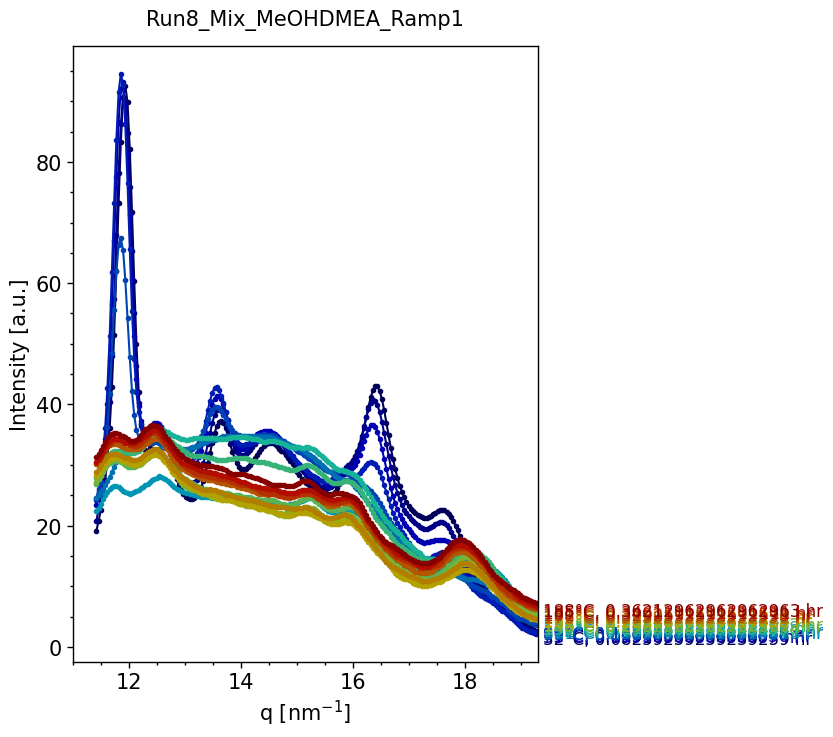

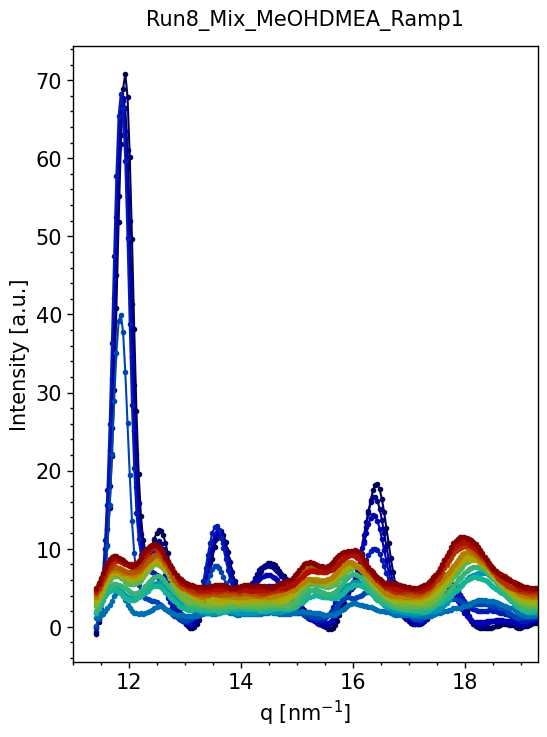

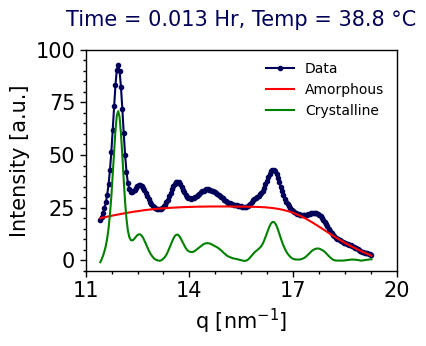

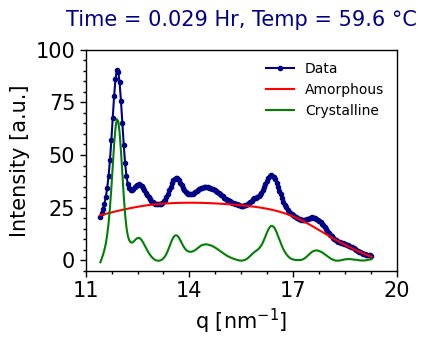

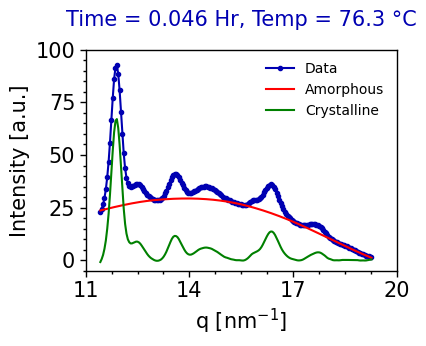

...

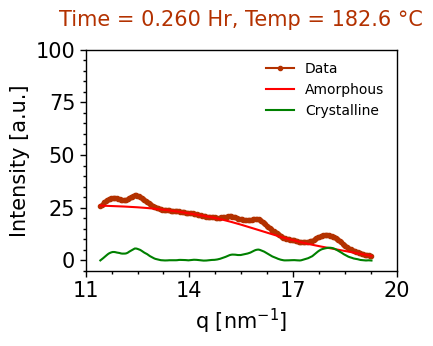

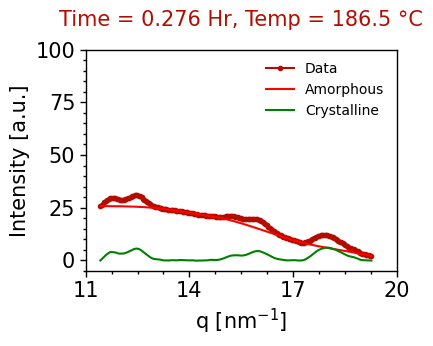

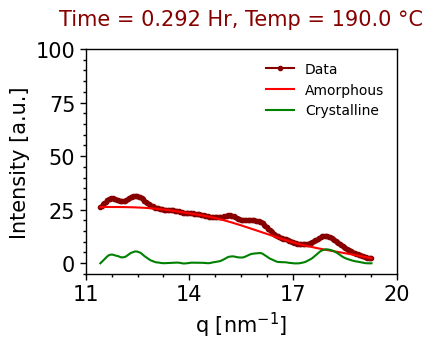

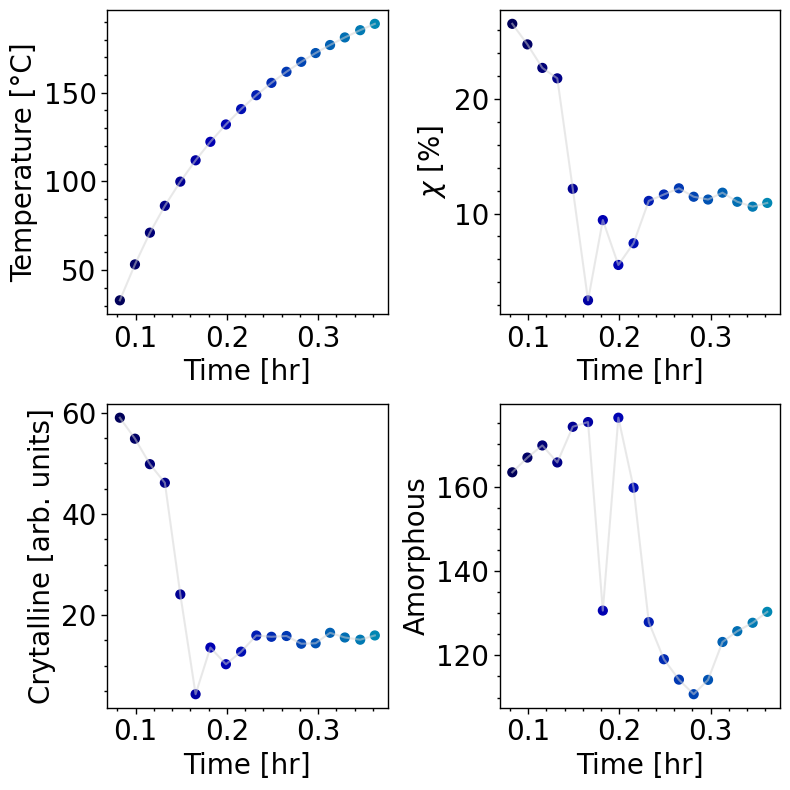

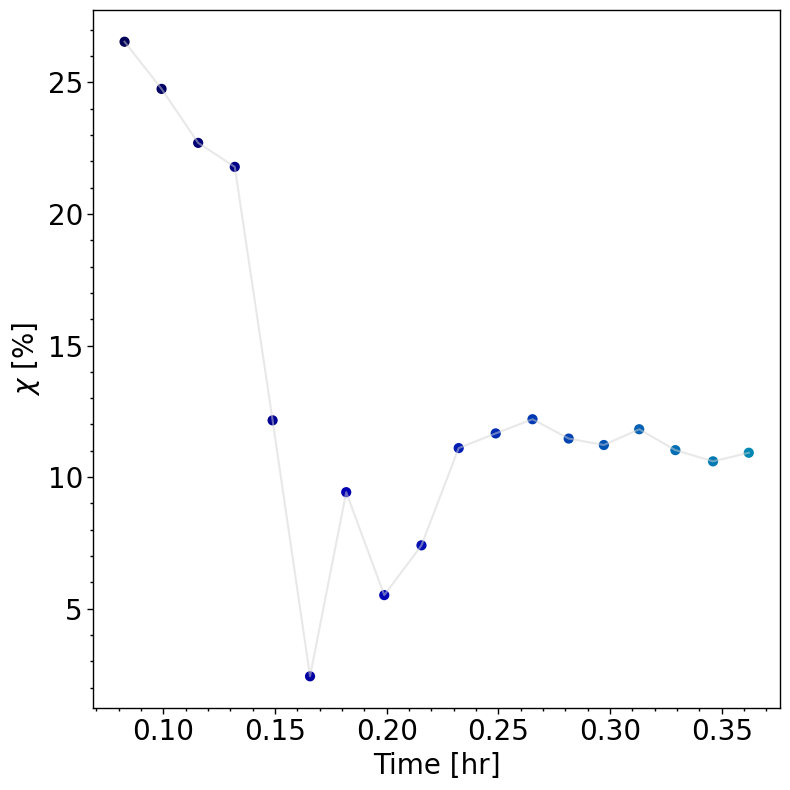

Run8_Mix_MeOHDMEA_Hold190_ctr0__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr1__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr2__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr3__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr4__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr5__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr6__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr7__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr8__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr9__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr10__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr11__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr12__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr13__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr14__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr15__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr16__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Hold190_ctr17__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Ho

/var/folders/0q/m0d3p44n2cb5dg956r2m2f782yh1mf/T/ipykernel_1879/4234584695.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs2 = plt.subplots(figsize=(4.3, 3.6))


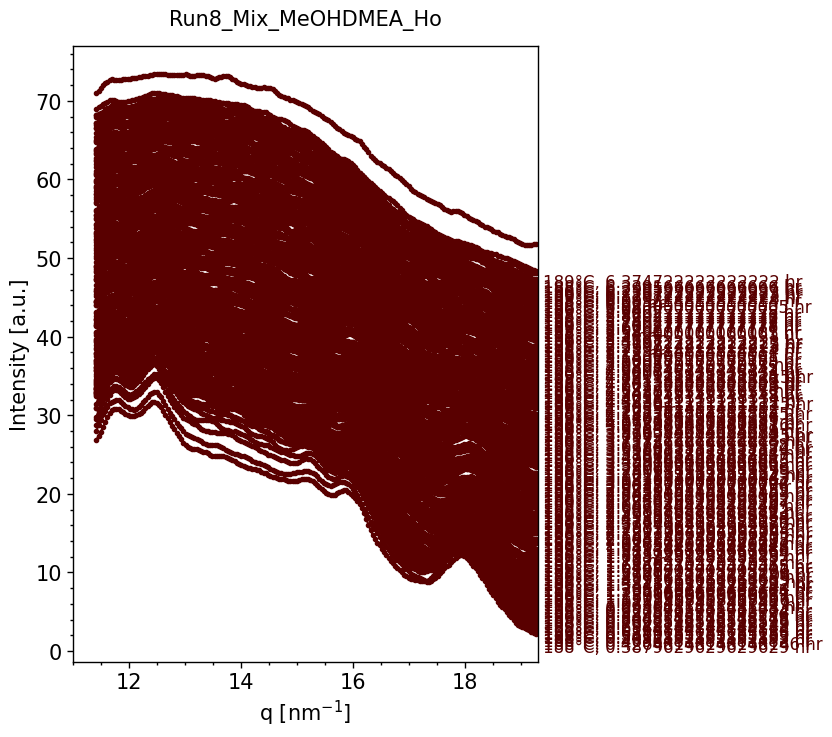

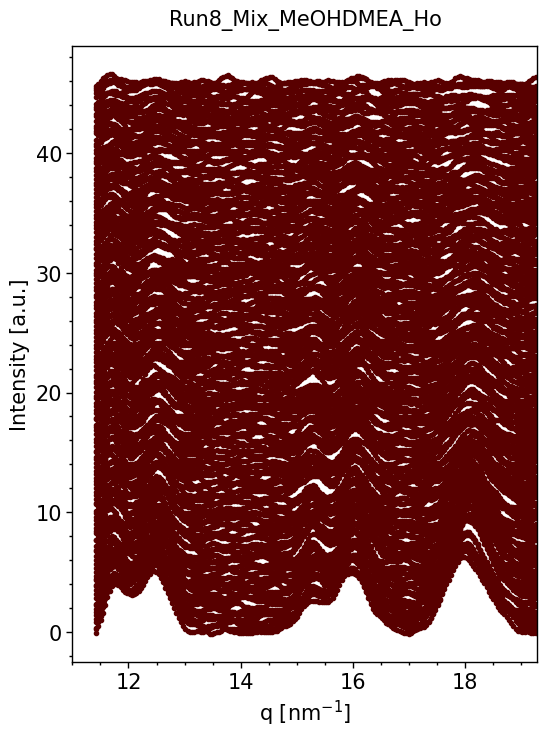

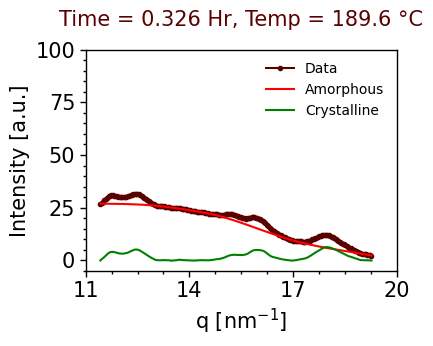

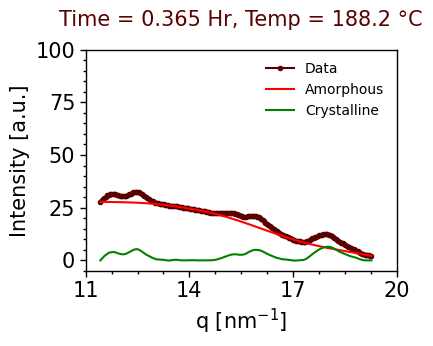

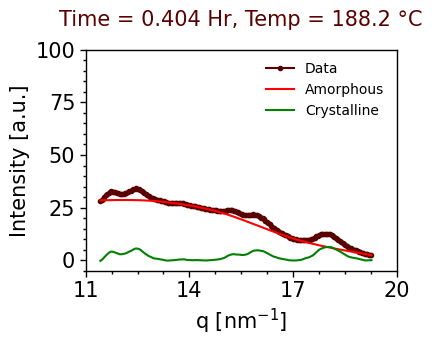

...

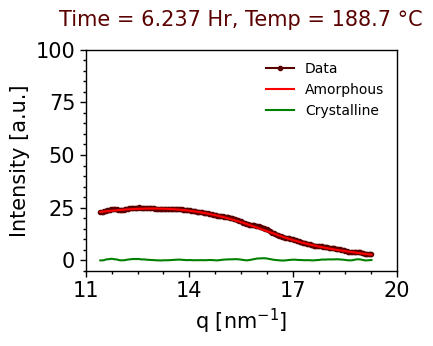

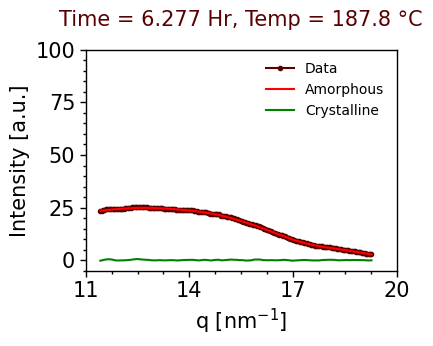

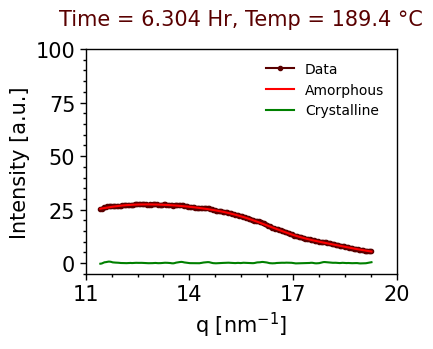

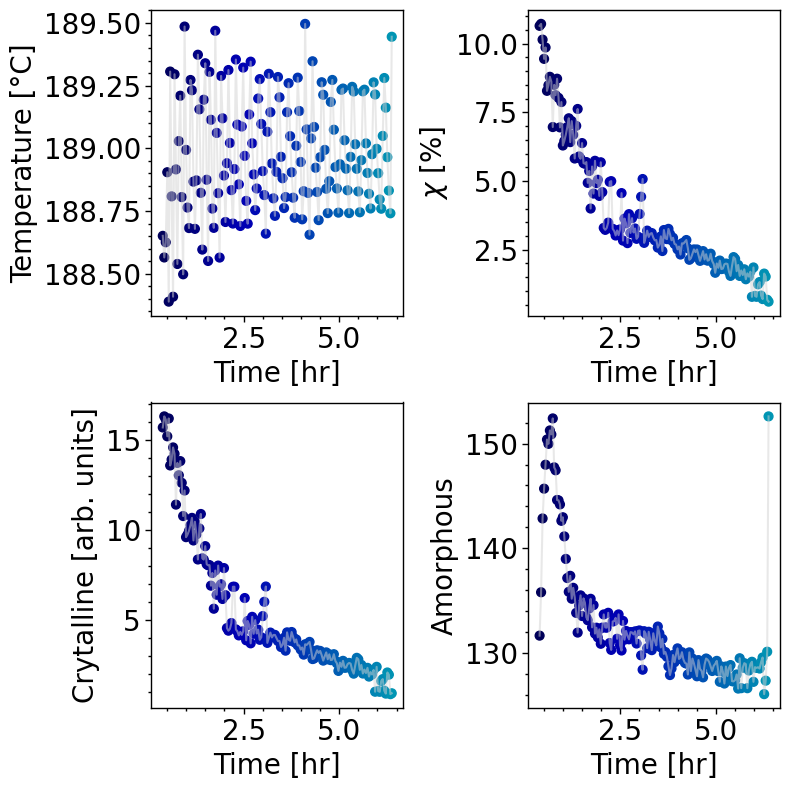

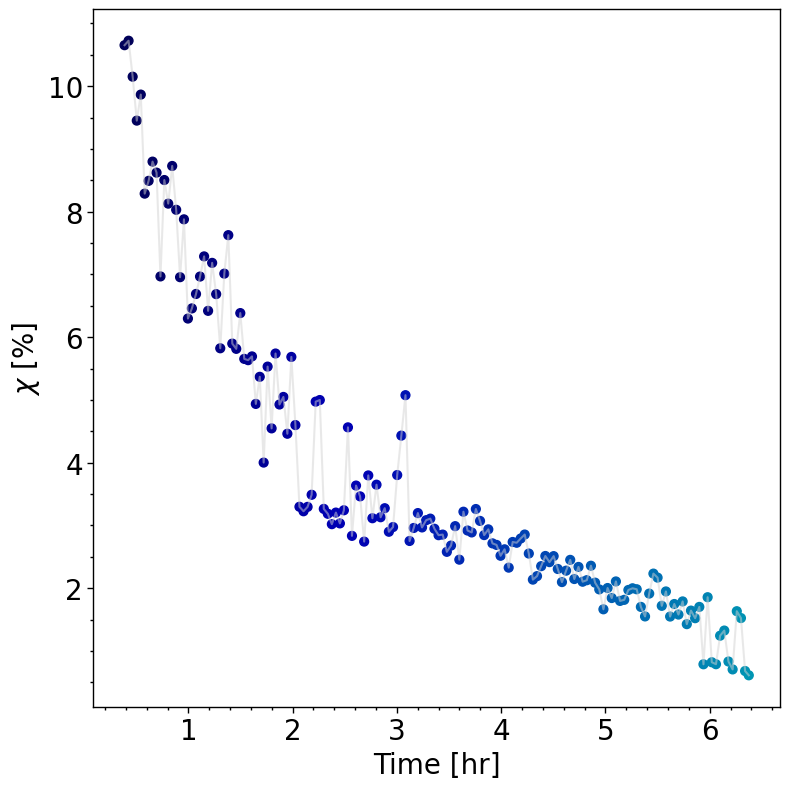

Run8_Mix_MeOHDMEA_Cool_ctr0__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr1__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr2__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr3__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr4__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr5__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr6__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr7__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr8__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr9__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr10__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr11__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr12__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr13__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr14__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr15__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr16__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr17__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool_ctr18__ratio_all_avg_sub.dat
Run8_Mix_MeOHDMEA_Cool

/var/folders/0q/m0d3p44n2cb5dg956r2m2f782yh1mf/T/ipykernel_1879/4234584695.py:60: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axs2 = plt.subplots(figsize=(4.3, 3.6))


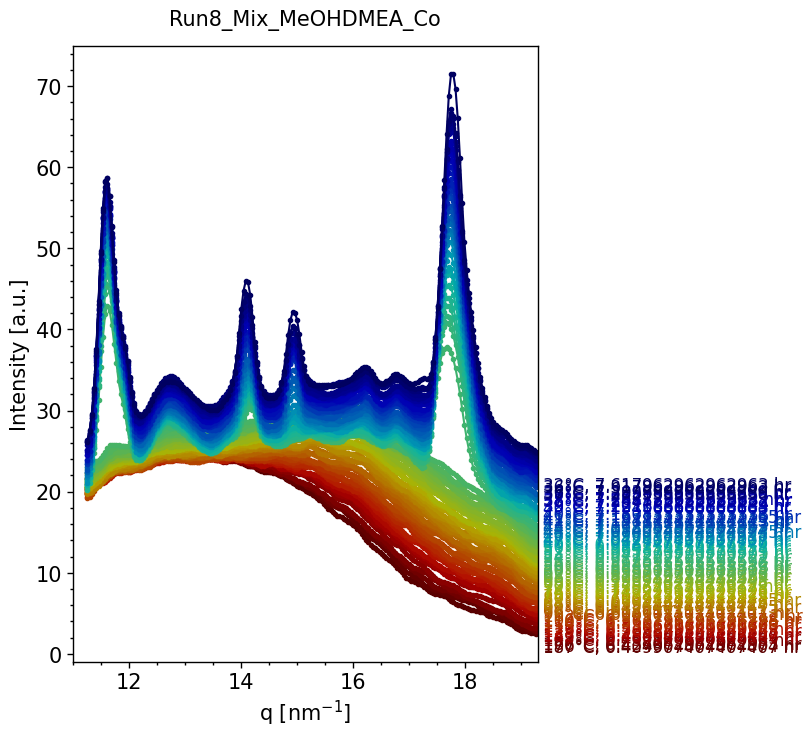

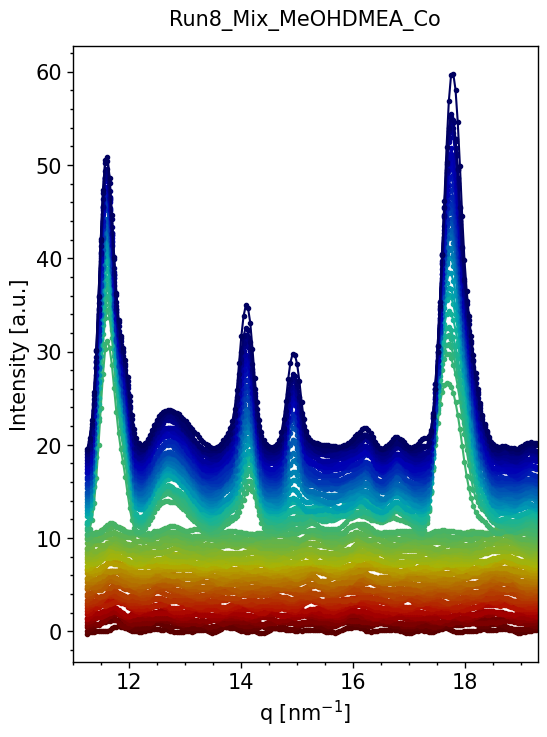

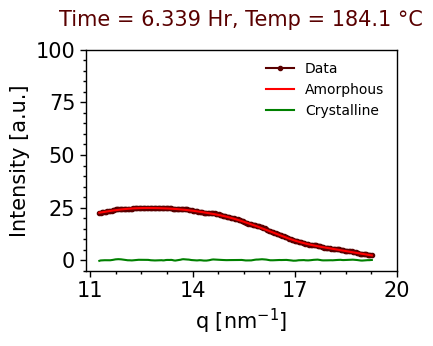

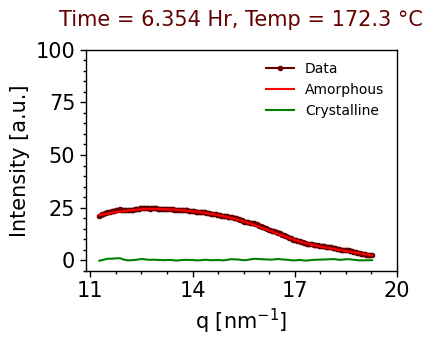

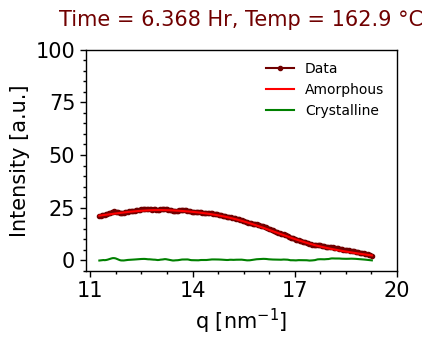

...

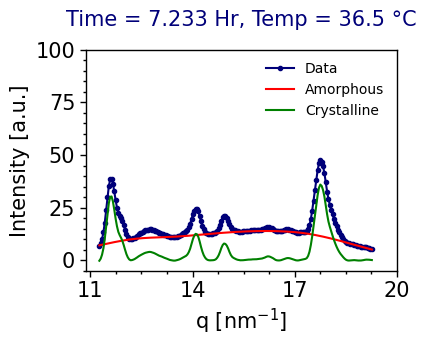

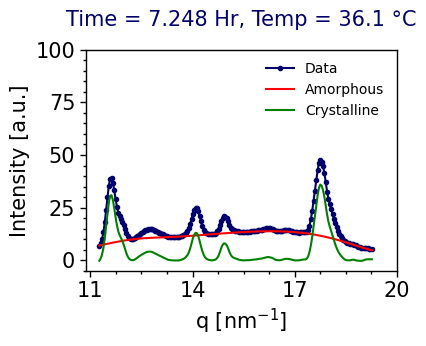

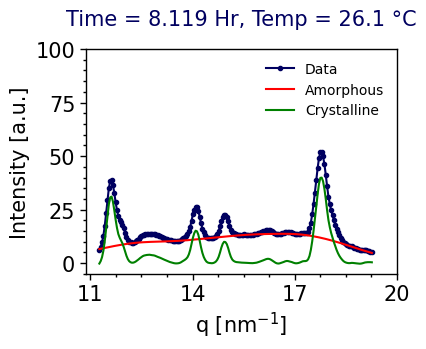

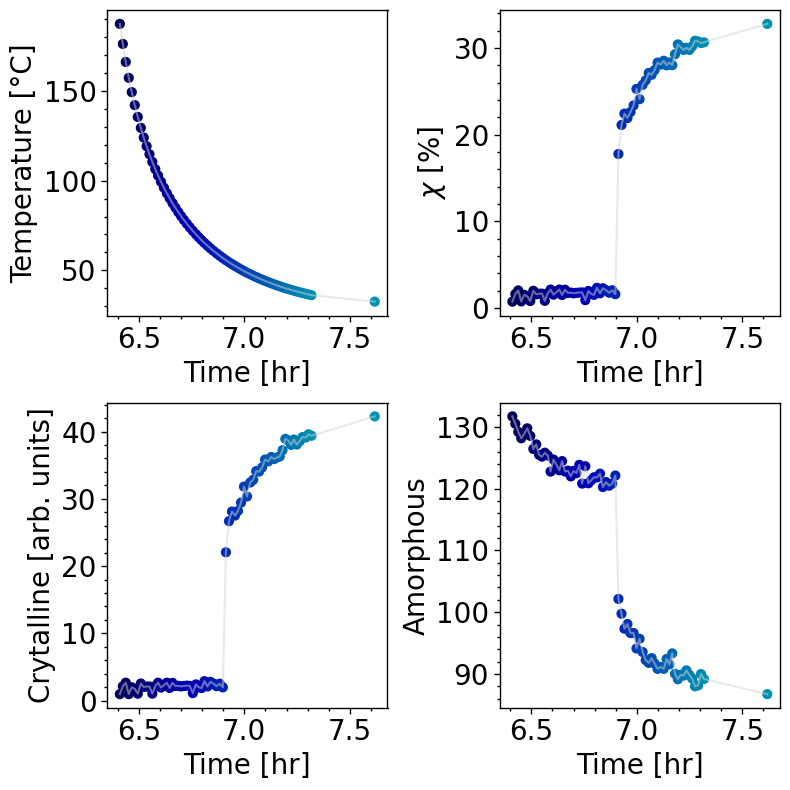

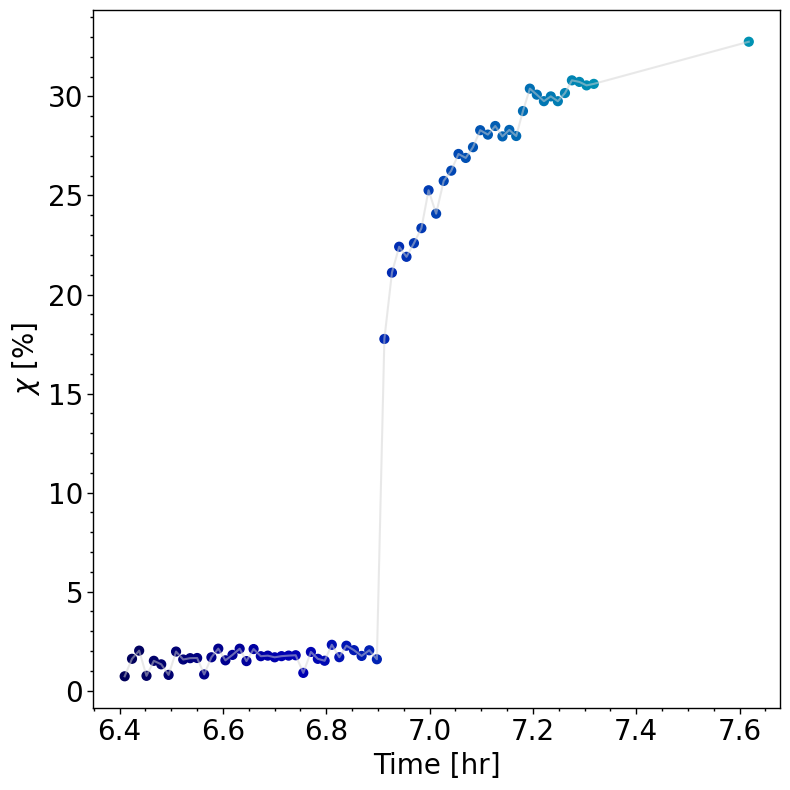

([6.409907407407407,
  6.424074074074074,
  6.437962962962963,
  6.45212962962963,
  6.466388888888889,
  6.480648148148148,
  6.494907407407407,
  6.509351851851853,
  6.52324074074074,
  6.536666666666666,
  6.550185185185185,
  6.563796296296296,
  6.577777777777778,
  6.591111111111111,
  6.604907407407407,
  6.618611111111111,
  6.6325,
  6.6456481481481475,
  6.659444444444444,
  6.673425925925926,
  6.6869444444444435,
  6.700277777777778,
  6.713425925925925,
  6.727222222222221,
  6.740925925925926,
  6.755648148148148,
  6.77037037037037,
  6.783796296296296,
  6.796944444444445,
  6.810833333333334,
  6.825370370370369,
  6.839074074074073,
  6.853703703703704,
  6.868518518518518,
  6.883333333333333,
  6.898055555555556,
  6.912592592592592,
  6.927222222222222,
  6.941203703703703,
  6.955370370370371,
  6.969814814814814,
  6.984259259259258,
  6.998148148148149,
  7.012777777777778,
  7.027407407407407,
  7.042037037037037,
  7.056018518518518,
  7.0700925925925935,
  7

In [97]:
# Call the function with your desired parameters
folder_path_base = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/Dec2023/OneD_integrated_WAXS_01/Correction/Normlised'

process_and_plot_data(folder_path_base, keyword="Run8_Mix_MeOHDMEA_Ramp190", status="Ramping", fonts=15,offset_factor=0.1, num_files_to_plot=54,
                         smmoth_window_size=6, start_index=0, num_ave_files=3, min_q_value = 11.4, max_q_value=19.3)

process_and_plot_data(folder_path_base, keyword="Run8_Mix_MeOHDMEA_Hold", status="Holding", fonts=15, offset_factor=0.1, num_files_to_plot=460,
                          smmoth_window_size=6, start_index=0, num_ave_files=3, min_q_value = 11.4, max_q_value=19.3)

process_and_plot_data(folder_path_base, keyword="Run8_Mix_MeOHDMEA_Cool", status="Cooling", fonts=15,offset_factor=0.1, num_files_to_plot=200,
                          smmoth_window_size=6, start_index=0, num_ave_files=3,min_q_value = 11.25, max_q_value=19.3)


hold

# 2D surface Plot: With Averaged frames

2D plot function


# Ramp

/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/Dec2023/OneD_integrated_WAXS_01//Final_Figures
0.0775
0.0 0.29


/var/folders/0q/m0d3p44n2cb5dg956r2m2f782yh1mf/T/ipykernel_1879/4292495025.py:111: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 1], pad=0, h_pad=0)


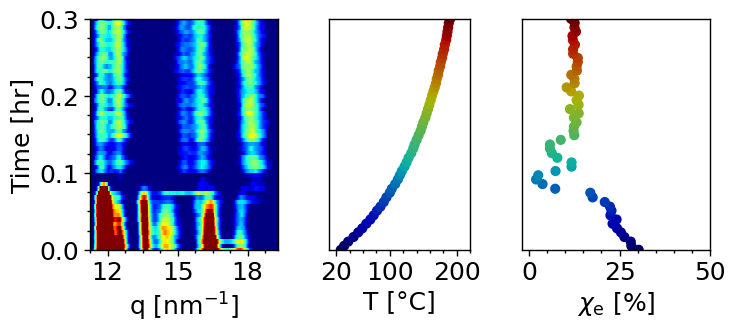

0.0775

In [91]:
import os
import numpy as np
import matplotlib.pyplot as plt

def custom_sort(file_name):
    keywords = ['_T', 'Ramp', 'Hold', 'Cool']
    keyword_found = next((kw for kw in keywords if kw in file_name), '')
    ctr_value = int(file_name.split('ctr')[-1].split('_')[0]) if 'ctr' in file_name else 0
    return (keywords.index(keyword_found), ctr_value)

def plot_2ddata_Ramp(folder_path_base, keyword,figx=8, fixy=8,vmin=0, vmax=10, color=1,wspace=0.3):
    WAXS_sub_files = os.path.join(folder_path_base.replace("Normlised", ""), "Subtracted")
    save_fig = os.path.join(WAXS_sub_files.replace("Subtracted", ""))
    save_extracted_data = os.path.join(save_fig, "Average_Amorph_Crystalline")
    save_fig_tmp = os.path.join(save_fig.replace("Correction", ""), "Final_Figures")
    print(save_fig_tmp)

    matching_sample_files = [file for file in os.listdir(save_extracted_data) if keyword in file]
    matching_sample_files.sort(key=lambda x: custom_sort(x))

    time_hr_values = []
    CTEMP_values = []
    intensity_data_list = []
    per_crytallinity_list = []  
    per_crytallinity_list_error = [] 
    q = np.array([])    
    
    for i, filename_search_sample in enumerate(matching_sample_files):
        #print(filename_search_sample)
        data, par1, par2, par3, par4, par5, par6, par7, par8, par9, par10 = read_single_file_with_keyword_general(save_extracted_data, filename_search_sample)

        q = np.array(data["col1"])
        I_frame_avg_smoothed = data["col2"]
        I_subtracted = data["col3"]

        time_hr_values.append(par1)
        CTEMP_values.append(par2)
        per_crytallinity_list.append(par5)
        per_crytallinity_list_error.append(par6)
        #print(par1, par2)

        intensity_data_list.append(I_subtracted)

    time_hr_values = np.array(time_hr_values)
    time0 = time_hr_values[0]
    print(time0)
    time_hr_values = time_hr_values - time0
    CTEMP_values = np.array(CTEMP_values)
    q_mesh, time_mesh = np.meshgrid(q, time_hr_values)

    intensity_data = np.empty((len(intensity_data_list), len(q)))

    for i, I_subtracted in enumerate(intensity_data_list):
        intensity_data[i, :len(q)] = I_subtracted

    num_colors = len(matching_sample_files) + 1
    darker_colors = darken_colors(num_colors, darker_factor=0.7)
    # Updated code
    if color == 1:
        colors = darker_colors[:len(matching_sample_files)]
    elif color == 2:
        # Make inverse of the darker colors
        colors = darker_colors[:len(matching_sample_files)][::-1]
    else:
        # Use the last color of darker colors for all points
        colors = [darker_colors[-1]] * len(CTEMP_values)

    # Create subplots with specified widths and reduce spacing
    fig, axs = plt.subplots(1, 3, figsize=(figx, fixy), gridspec_kw={'width_ratios': [2, 1.5, 2], 'wspace': wspace})

    # Set the aspect ratio for the middle subplot
    #axs[1].set_aspect('equal')
    fonts=18
    # First subplot
    im = axs[0].pcolormesh(q_mesh, time_mesh, intensity_data, cmap='jet', shading='auto', vmin=vmin, vmax=vmax)
    set_plot_style(axs[0], fonts, 'q [$\\mathrm{nm^{-1}}$]', 'Time [hr]')
    axs[0].yaxis.set_major_formatter(FuncFormatter(lambda value, _: '{:.1f}'.format(value)))
    axs[0].minorticks_on()
    axs[0].grid(False)
    #axs[0].set_yticks([0.0,0.1,0.2])
    print(min(time_hr_values), max(time_hr_values))
    # devide max min to set 4 yticks equidistant
    axs[0].set_yticks(np.linspace(min(time_hr_values), max(time_hr_values), 4)) 
    axs[0].set_xticks([12,15,18])
    axs[0].set_ylim([min(time_hr_values), max(time_hr_values)])

    # Second subplot
    axs[1].scatter(CTEMP_values, time_hr_values, marker='o', s=40, c=colors)
    set_plot_style(axs[1], fonts, 'T [°C]', '')
    axs[1].set_ylim([min(time_hr_values), max(time_hr_values)])
    axs[1].set_xlim(10, 220)
    axs[1].minorticks_on()
    axs[1].set_xticks([20,100,200])
    axs[1].set_yticks([])

    # Third subplot
    axs[2].scatter(per_crytallinity_list, time_hr_values, marker='o', c=colors, s=40)
    set_plot_style(axs[2], fonts, r'$\chi_{\mathrm{e}}$ [%]', '')
    #r'$\chi_r$ [%]'
    axs[2].set_ylim([min(time_hr_values), max(time_hr_values)])
    axs[2].set_xlim(-2, 50)
    

    # Customize tick labels
    #custom_ticks =   # Customize as needed
    axs[2].set_xticks([0,25,50])
    axs[2].set_yticks([])
    axs[2].minorticks_on()

    # Adjust layout and save the figure
    plt.tight_layout(rect=[0, 0, 1, 1], pad=0, h_pad=0)
    plt.savefig(os.path.join(save_fig_tmp, f"{keyword}_2D_WAXS_combined.png"), dpi=300)

    # Show the final figure
    plt.show()
    return  time0




folder_path_base = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/Dec2023/OneD_integrated_WAXS_01/Correction/Normlised'

#plot_2ddata(folder_path_base, keyword,figx=8, fixy=8,vmin=0, vmax=10, color=1)
# Call the function with the desired parameters

#plot_2ddata_Cool(folder_path_base, 'Run8_Mix_MeOHDMEA_Cool',5,3, 1, 20,2)
#plot_2ddata_Hold(folder_path_base, 'Run8_Mix_MeOHDMEA_Hold',5,4, 1, 10,3)
plot_2ddata_Ramp(folder_path_base, 'Run8_Mix_MeOHDMEA_Ramp',8,3, 1, 10,1)

# Hold temp

/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/Dec2023/OneD_integrated_WAXS_01//Final_Figures
Run8_Mix_MeOHDMEA_Hold190_ctr2__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr5__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr8__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr11__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr14__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr17__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr20__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr23__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr26__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr29__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr32__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr35__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr38__ratio_

/var/folders/0q/m0d3p44n2cb5dg956r2m2f782yh1mf/T/ipykernel_1879/2457212462.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 1], pad=0, h_pad=0)


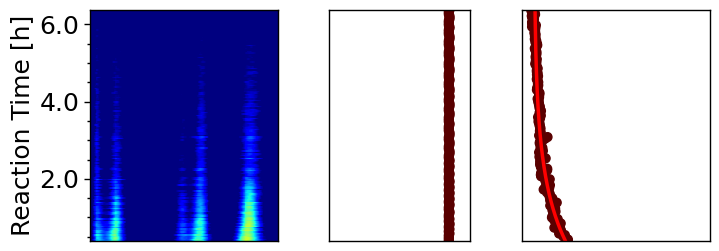

(0.05663469834544673, 13.989413740511353)

In [99]:
import os
import numpy as np
import matplotlib.pyplot as plt

def custom_sort(file_name):
    keywords = ['_T', 'Ramp', 'Hold', 'Cool']
    keyword_found = next((kw for kw in keywords if kw in file_name), '')
    ctr_value = int(file_name.split('ctr')[-1].split('_')[0]) if 'ctr' in file_name else 0
    return (keywords.index(keyword_found), ctr_value)




import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit

def calculate_decomposition_rate(time_hr_values, per_crytallinity_list):
    """
    Fit crystallinity vs time data using an exponential decay model and calculate the decomposition rate.

    Parameters:
    - time_hr_values: numpy array of time values in hours
    - per_crytallinity_list: numpy array of corresponding crystallinity values

    Returns:
    - decomposition_rate: The calculated decomposition rate
    - fitted_crytallinity: The array of fitted crystallinity values
    - chi_squared: Goodness of fit (chi-squared value)
    """

    # Define an exponential decay model for fitting
    def exponential_decay_model(time, A, k, c):
        return A * np.exp(-k * time) + c

    # Fit the model to the data
    popt, pcov = curve_fit(exponential_decay_model, time_hr_values, per_crytallinity_list)

    # Extract the decomposition rate (decay constant of the exponential model)
    decomposition_rate = popt[1]

    # Generate the array of fitted crystallinity values
    fitted_crytallinity = exponential_decay_model(time_hr_values, *popt)

    # Calculate the normalized decomposition rate
    initial_crytallinity = per_crytallinity_list[0]
    normalized_decomposition_rate = decomposition_rate / initial_crytallinity



    # Calculate chi-squared value (goodness of fit)
    residuals = per_crytallinity_list - fitted_crytallinity
    chi_squared = np.sum((residuals / per_crytallinity_list) ** 2)

    return normalized_decomposition_rate, fitted_crytallinity, chi_squared

# Example usage:
# decomposition_rate, fitted_crytallinity, chi_squared = calculate_decomposition_rate(time_hr_values, per_crytallinity_list)


def plot_2ddata_Hold(folder_path_base, keyword,figx=8, fixy=8,vmin=0, vmax=10, color=1,wspace=0.3,time0=0):
    WAXS_sub_files = os.path.join(folder_path_base.replace("Normlised", ""), "Subtracted")
    save_fig = os.path.join(WAXS_sub_files.replace("Subtracted", ""))
    save_extracted_data = os.path.join(save_fig, "Average_Amorph_Crystalline")
    save_fig_tmp = os.path.join(save_fig.replace("Correction", ""), "Final_Figures")
    print(save_fig_tmp)

    matching_sample_files = [file for file in os.listdir(save_extracted_data) if keyword in file]
    matching_sample_files.sort(key=lambda x: custom_sort(x))

    time_hr_values = []
    CTEMP_values = []
    intensity_data_list = []
    per_crytallinity_list = []  
    per_crytallinity_list_error = []
    q = np.array([])    
    
    for i, filename_search_sample in enumerate(matching_sample_files):
        print(filename_search_sample)
        data, par1, par2, par3, par4, par5, par6, par7, par8, par9, par10 = read_single_file_with_keyword_general(save_extracted_data, filename_search_sample)

        q = np.array(data["col1"])
        I_frame_avg_smoothed = data["col2"]
        I_subtracted = data["col3"]

        time_hr_values.append(par1)
        CTEMP_values.append(par2)
        per_crytallinity_list.append(par5)
        per_crytallinity_list_error.append(par6)
        #print(par1, par2)

        intensity_data_list.append(I_subtracted)

    time_hr_values = np.array(time_hr_values) - time0
    CTEMP_values = np.array(CTEMP_values)
    q_mesh, time_mesh = np.meshgrid(q, time_hr_values)
    normalized_decomposition_rate, fitted_crytallinity, chi_squared = calculate_decomposition_rate(time_hr_values, per_crytallinity_list)
    # print the decomposition rate and chi-squared value in 2 different lines   

    print(normalized_decomposition_rate, chi_squared)
    intensity_data = np.empty((len(intensity_data_list), len(q)))

    for i, I_subtracted in enumerate(intensity_data_list):
        intensity_data[i, :len(q)] = I_subtracted

    num_colors = len(matching_sample_files) + 1
    darker_colors = darken_colors(num_colors, darker_factor=0.7)
    # Updated code
    if color == 1:
        colors = darker_colors[:len(matching_sample_files)]
    elif color == 2:
        # Make inverse of the darker colors
        colors = darker_colors[:len(matching_sample_files)][::-1]
    else:
        # Use the last color of darker colors for all points
        colors = [darker_colors[-1]] * len(CTEMP_values)

    # Create subplots with specified widths and reduce spacing
    fig, axs = plt.subplots(1, 3, figsize=(figx, fixy), gridspec_kw={'width_ratios': [2, 1.5, 2], 'wspace': wspace})

    # Set the aspect ratio for the middle subplot
    #axs[1].set_aspect('equal')
    fonts=18
    # First subplot
    im = axs[0].pcolormesh(q_mesh, time_mesh, intensity_data, cmap='jet', shading='auto', vmin=vmin, vmax=vmax)
    axs[0].yaxis.set_major_formatter(FuncFormatter(lambda value, _: '{:.1f}'.format(value)))
    set_plot_style(axs[0], fonts, '', 'Reaction Time [h]')
    axs[0].minorticks_on()
    axs[0].grid(False)
    axs[0].set_xticks([])
    axs[0].set_ylim([min(time_hr_values), max(time_hr_values)])

    # Second subplot
    axs[1].scatter(CTEMP_values, time_hr_values, marker='o', s=40, c=colors)
    set_plot_style(axs[1], fonts, '', '')
    axs[1].set_ylim([min(time_hr_values), max(time_hr_values)])
    axs[1].set_xlim(10, 220)
    axs[1].minorticks_on()
    axs[1].set_xticks([])
    axs[1].set_yticks([])

    # Third subplot
    axs[2].scatter(per_crytallinity_list, time_hr_values, marker='o', c=colors, s=40)
    axs[2].plot(fitted_crytallinity,time_hr_values,linewidth=2.5, label='Exponetial Fit', color='red')
    set_plot_style(axs[2], fonts, '', '')
    axs[2].set_ylim([min(time_hr_values), max(time_hr_values)])
    axs[2].set_xlim(-2, 50)
    #axs[2].minorticks_on()
    #axs[2].set_xticks([])
    #axs[2].set_yticks([])
    #axs[2].legend(loc='upper right', fontsize=fonts-8,frameon=False)  
    

    # Customize tick labels
    #custom_ticks =   # Customize as needed
    axs[2].set_xticks([])
    axs[2].set_yticks([])
    axs[2].minorticks_on()

    # Adjust layout and save the figure
    plt.tight_layout(rect=[0, 0, 1, 1], pad=0, h_pad=0)
    plt.savefig(os.path.join(save_fig_tmp, f"{keyword}_2D_WAXS_combined.png"), dpi=300)

    # Show the final figure
    plt.show()
    return normalized_decomposition_rate,  chi_squared




folder_path_base = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/Dec2023/OneD_integrated_WAXS_01/Correction/Normlised'

#plot_2ddata(folder_path_base, keyword,figx=8, fixy=8,vmin=0, vmax=10, color=1)
# Call the function with the desired parameters

#plot_2ddata_Cool(folder_path_base, 'Run8_Mix_MeOHDMEA_Cool',5,3, 1, 20,2)
plot_2ddata_Hold(folder_path_base, 'Run8_Mix_MeOHDMEA_Hold',8,3, 1, 10,3,time0=0)
#plot_2ddata_Ramp(folder_path_base, 'Run8_Mix_MeOHDMEA_Ramp',8,3, 1, 10,1)

# Cooling

In [100]:
import os
import numpy as np
import matplotlib.pyplot as plt

def custom_sort(file_name):
    keywords = ['_T', 'Ramp', 'Hold', 'Cool']
    keyword_found = next((kw for kw in keywords if kw in file_name), '')
    ctr_value = int(file_name.split('ctr')[-1].split('_')[0]) if 'ctr' in file_name else 0
    return (keywords.index(keyword_found), ctr_value)

def plot_2ddata_Cool(folder_path_base, keyword,figx=8, fixy=8,vmin=0, vmax=10, color=1,wspace=0.3,time0=0):
    WAXS_sub_files = os.path.join(folder_path_base.replace("Normlised", ""), "Subtracted")
    save_fig = os.path.join(WAXS_sub_files.replace("Subtracted", ""))
    save_extracted_data = os.path.join(save_fig, "Average_Amorph_Crystalline")
    save_fig_tmp = os.path.join(save_fig.replace("Correction", ""), "Final_Figures")
    print(save_fig_tmp)

    matching_sample_files = [file for file in os.listdir(save_extracted_data) if keyword in file]
    matching_sample_files.sort(key=lambda x: custom_sort(x))

    time_hr_values = []
    CTEMP_values = []
    intensity_data_list = []
    per_crytallinity_list = []  
    per_crytallinity_list_error = []
    q = np.array([])    
    
    for i, filename_search_sample in enumerate(matching_sample_files):
        print(filename_search_sample)
        data, par1, par2, par3, par4, par5, par6, par7, par8, par9, par10 = read_single_file_with_keyword_general(save_extracted_data, filename_search_sample)

        q = np.array(data["col1"])
        I_frame_avg_smoothed = data["col2"]
        I_subtracted = data["col3"]

        time_hr_values.append(par1)
        CTEMP_values.append(par2)
        per_crytallinity_list.append(par5)
        per_crytallinity_list_error.append(par6)
        #print(par1, par2)

        intensity_data_list.append(I_subtracted)

    time_hr_values = np.array(time_hr_values)-time0
    # subtract the first value from the time values


    CTEMP_values = np.array(CTEMP_values)
    q_mesh, time_mesh = np.meshgrid(q, time_hr_values)

    intensity_data = np.empty((len(intensity_data_list), len(q)))

    for i, I_subtracted in enumerate(intensity_data_list):
        intensity_data[i, :len(q)] = I_subtracted

    num_colors = len(matching_sample_files) + 1
    darker_colors = darken_colors(num_colors, darker_factor=0.7)
    # Updated code
    if color == 1:
        colors = darker_colors[:len(matching_sample_files)]
    elif color == 2:
        # Make inverse of the darker colors
        colors = darker_colors[:len(matching_sample_files)][::-1]
    else:
        # Use the last color of darker colors for all points
        colors = [darker_colors[-1]] * len(CTEMP_values)

    # Create subplots with specified widths and reduce spacing
    fig, axs = plt.subplots(1, 3, figsize=(figx, fixy), gridspec_kw={'width_ratios': [2, 1.5, 2], 'wspace': wspace})

    # Set the aspect ratio for the middle subplot
    #axs[1].set_aspect('equal')
    fonts=18
    # First subplot
    im = axs[0].pcolormesh(q_mesh, time_mesh, intensity_data, cmap='jet', shading='auto', vmin=vmin, vmax=vmax)
    axs[0].yaxis.set_major_formatter(FuncFormatter(lambda value, _: '{:.1f}'.format(value)))
    set_plot_style(axs[0], fonts, '', 'Time (hr)    ')
    axs[0].minorticks_on()
    axs[0].grid(False)
    print(min(time_hr_values), max(time_hr_values))
    # devide max min to set 4 yticks equidistant
    axs[0].set_yticks(np.linspace(min(time_hr_values+0.05), max(time_hr_values), 3)) 
   
    axs[0].set_xticks([])
    axs[0].set_ylim([min(time_hr_values), max(time_hr_values)])

    # Second subplot
    axs[1].scatter(CTEMP_values, time_hr_values, marker='o', s=40, c=colors)
    set_plot_style(axs[1], fonts, '', '')
    axs[1].set_ylim([min(time_hr_values), max(time_hr_values)])
    axs[1].set_xlim(10, 220)
    axs[1].minorticks_on()
    axs[1].set_xticks([])
    axs[1].set_yticks([])

    # Third subplot
    axs[2].scatter(per_crytallinity_list, time_hr_values, marker='o', c=colors, s=40)
    set_plot_style(axs[2], fonts, '', '')
    axs[2].set_ylim([min(time_hr_values), max(time_hr_values)])
    axs[2].set_xlim(-2, 50)
    

    # Customize tick labels
    #custom_ticks =   # Customize as needed
    axs[2].set_xticks([])
    axs[2].set_yticks([])
    axs[2].minorticks_on()

    # Adjust layout and save the figure
    plt.tight_layout(rect=[0, 0, 1, 1], pad=0, h_pad=0)
    plt.savefig(os.path.join(save_fig_tmp, f"{keyword}_2D_WAXS_combined.png"), dpi=300)

    # Show the final figure
    plt.show()






# plot all final

/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/Dec2023/OneD_integrated_WAXS_01//Final_Figures
0.08259259259259259
0.0 0.27953703703703703


/var/folders/0q/m0d3p44n2cb5dg956r2m2f782yh1mf/T/ipykernel_1879/4292495025.py:111: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 1], pad=0, h_pad=0)


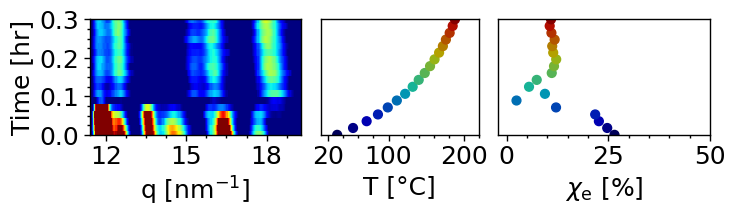

/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/Dec2023/OneD_integrated_WAXS_01//Final_Figures
Run8_Mix_MeOHDMEA_Cool_ctr2__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr5__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr8__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr11__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr14__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr17__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr20__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr23__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr26__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr29__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr32__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr35__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr38__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_Me

/var/folders/0q/m0d3p44n2cb5dg956r2m2f782yh1mf/T/ipykernel_1879/5100516.py:110: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 1], pad=0, h_pad=0)


Run8_Mix_MeOHDMEA_Cool_ctr185__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr188__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr191__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr194__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Cool_ctr197__ratio_all_avgframe_avg_am_cry.dat
6.327314814814814 7.23537037037037


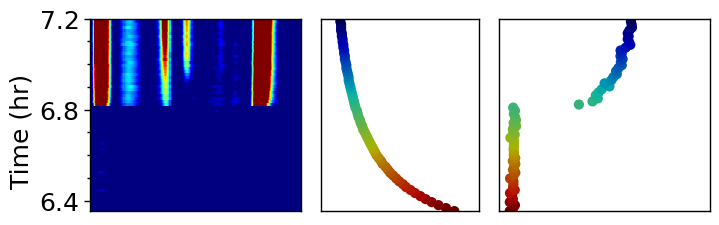

/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/Dec2023/OneD_integrated_WAXS_01//Final_Figures
Run8_Mix_MeOHDMEA_Hold190_ctr2__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr5__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr8__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr11__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr14__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr17__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr20__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr23__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr26__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr29__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr32__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr35__ratio_all_avgframe_avg_am_cry.dat
Run8_Mix_MeOHDMEA_Hold190_ctr38__ratio_

/var/folders/0q/m0d3p44n2cb5dg956r2m2f782yh1mf/T/ipykernel_1879/2457212462.py:161: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout(rect=[0, 0, 1, 1], pad=0, h_pad=0)


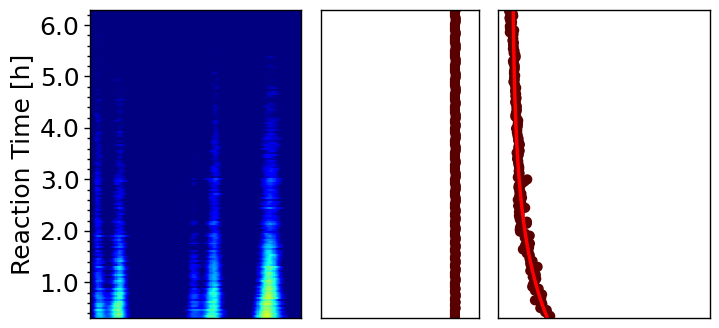

0.05663468540398349 13.98940794901692


In [101]:
folder_path_base = '/Users/akmaurya/Library/CloudStorage/OneDrive-SLACNationalAcceleratorLaboratory/My Onedrive/Data_01/Methanolysis/Dec2023/OneD_integrated_WAXS_01/Correction/Normlised'

#plot_2ddata(folder_path_base, keyword,figx=8, fixy=8,vmin=0, vmax=10, color=1)
# Call the function with the desired parameters
time0=plot_2ddata_Ramp(folder_path_base, 'Run8_Mix_MeOHDMEA_Ramp',8,1.5, 1, 10,1, 0.1)
plot_2ddata_Cool(folder_path_base, 'Run8_Mix_MeOHDMEA_Cool',8,2.5, 1, 10,2,0.1,time0=time0)
normalized_decomposition_rate, chi_squared = plot_2ddata_Hold(folder_path_base, 'Run8_Mix_MeOHDMEA_Hold',8,4, 1, 10,3,0.1,time0=time0)
print (normalized_decomposition_rate, chi_squared )
